# Differential Gene Expressión Analysis 

## Pseudo Bulk method (edgeR)

In [1]:
import warnings

warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
import random
import sc_toolbox

import rpy2.rinterface_lib.callbacks
import anndata2ri
import logging

from rpy2.robjects import pandas2ri
from rpy2.robjects import r

sc.settings.verbosity = 0
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

In [2]:
%%R
library(edgeR)

Loading required package: limma


In [3]:
t_adata = sc.read_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/2T_temp.h5ad')
t_adata

AnnData object with n_obs × n_vars = 53864 × 12633
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'CellType', 'Batch', 'predicted', 'transfer_score', 'hcc_ref1_label', 'hcc_ref1_score', 'hcc_ref2_label', 'hcc_ref2_score', 'hcc_ref4_label', 'hcc_ref4_score', 'overcluster', 'scVI_Model_Predictions', 'HCC_Atlas_1', 'HCC_Atlas_2', 'HCC_Atlas_3'
    var: 'n_cells'
    uns: 'HCC_Atlas_1_colors', 'HCC_Atlas_2_colors', 'HCC_Atlas_3_colors', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'overcluster', 'scVI_Model_Predictions_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
t_adata.obs['DX'] = t_adata.obs['DX'].replace({'adjacent tissue': 'HCC', 'tumor tissue': 'HCC'})
t_adata.obs['DX'].unique()

['HCC']
Categories (1, object): ['HCC']

In [5]:
t_adata

AnnData object with n_obs × n_vars = 53864 × 12633
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'CellType', 'Batch', 'predicted', 'transfer_score', 'hcc_ref1_label', 'hcc_ref1_score', 'hcc_ref2_label', 'hcc_ref2_score', 'hcc_ref4_label', 'hcc_ref4_score', 'overcluster', 'scVI_Model_Predictions', 'HCC_Atlas_1', 'HCC_Atlas_2', 'HCC_Atlas_3'
    var: 'n_cells'
    uns: 'HCC_Atlas_1_colors', 'HCC_Atlas_2_colors', 'HCC_Atlas_3_colors', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'overcluster', 'scVI_Model_Predictions_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [6]:
c_adata = sc.read_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/2_5C_annotated.h5ad')
c_adata

AnnData object with n_obs × n_vars = 41300 × 14877
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'CellType', 'Batch', 'predicted', 'transfer_score', 'typist_label', 'typist_score', 'ref3_healthy_label', 'ref3_healthy_score', 'overcluster', 'Cell_Typist_Atlas', 'Healthy_Liver_Atlas(CellxGene_DB)', 'Healthy_Liver_Atlas(CellxGene_DB', 'scVI_Model_Predictions'
    var: 'n_cells'
    uns: 'Cell_Type_colors', 'Cell_Typist_Atlas_colors', 'Healthy_Liver_Atlas(CellxGene_DB_colors', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'overcluster', 'scVI_Model_Predictions_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [7]:
# Realizar el merge manteniendo únicamente las claves comunes
adata = t_adata.concatenate(
    c_adata,
    join='outer',  # Mantener solo las claves comunes
    batch_key='dataset', 
    batch_categories=['t_adata', 'c_adata']
)

adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'CellType', 'Batch', 'predicted', 'transfer_score', 'hcc_ref1_label', 'hcc_ref1_score', 'hcc_ref2_label', 'hcc_ref2_score', 'hcc_ref4_label', 'hcc_ref4_score', 'overcluster', 'scVI_Model_Predictions', 'HCC_Atlas_1', 'HCC_Atlas_2', 'HCC_Atlas_3', 'typist_label', 'typist_score', 'ref3_healthy_label', 'ref3_healthy_score', 'Cell_Typist_Atlas', 'Healthy_Liver_Atlas(CellxGene_DB)', 'Healthy_Liver_Atlas(CellxGene_DB', 'dataset'
    var: 'n_cells-c_adata', 'n_cells-t_adata'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [8]:
adata.obs = adata.obs.drop(columns=['CellType'])


In [9]:
# Eliminar todas las columnas en obs que contienen NaN
adata.obs = adata.obs.dropna(axis=1, how='any')
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'scVI_Model_Predictions', 'dataset'
    var: 'n_cells-c_adata', 'n_cells-t_adata'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [10]:
adata.obs['scVI_Model_Predictions'].unique()

['B cells', 'CD4-CD69-memory T cells', 'TAM', 'TAMs', 'Cholangiocytes', ..., 'Plasmacytoid dendritic cells', 'Endothelial cells', 'Macrophages', 'Platelets', 'Erythroid-like']
Length: 31
Categories (31, object): ['B cells', 'B-cell', 'CAF', 'CD4-CD69-memory T cells', ..., 'c2-CCL4L2-M2 Macrophage', 'c3-TPSB2-Mast cells', 'tumor', 'unclassified']

In [11]:
# Replace NaNs in adata.X and adata.obsm["X_scVI"]
adata.X = np.nan_to_num(adata.X, nan=0.0)
adata.obsm["X_scVI"] = np.nan_to_num(adata.obsm["X_scVI"], nan=0.0)



In [12]:
sc.pp.neighbors(adata, use_rep="X_scVI")  # Usamos la representación corregida por scVI
sc.tl.umap(adata)

2024-11-09 02:03:59.492347: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-09 02:03:59.511719: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-09 02:03:59.517350: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-09 02:03:59.532087: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-09 02:04:00.508389: W tensorflow/comp

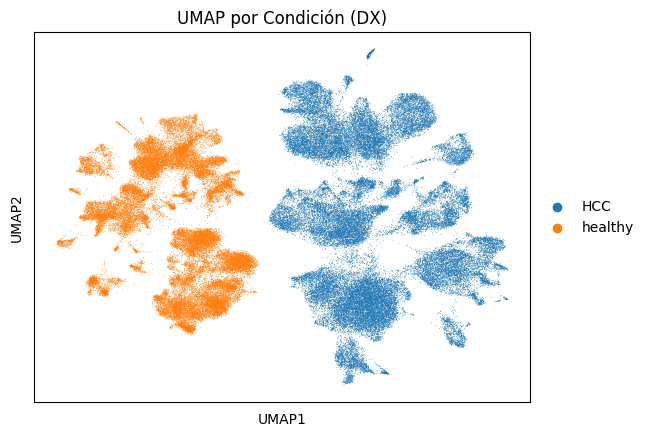

In [13]:
sc.pl.umap(adata, color="DX", title="UMAP por Condición (DX)")


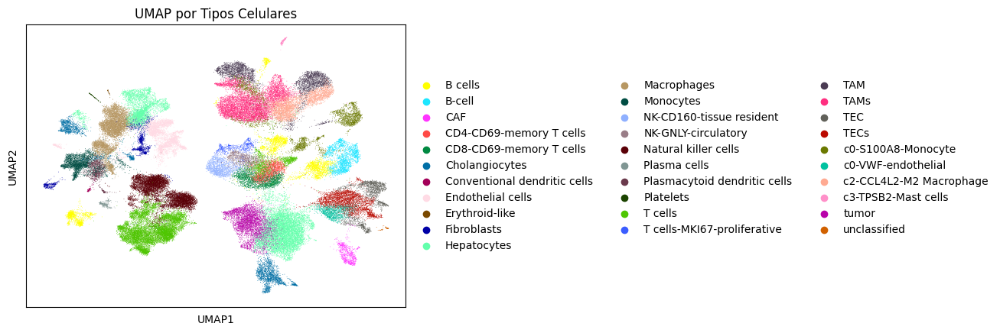

In [14]:
sc.pl.umap(adata, color="scVI_Model_Predictions", title="UMAP por Tipos Celulares")


In [15]:
sc.tl.pca(adata)


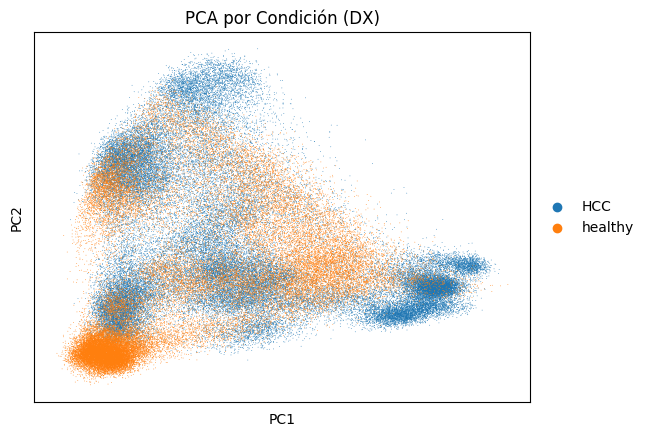

In [16]:
sc.pl.pca(adata, color="DX", title="PCA por Condición (DX)")


In [17]:
sc.pp.neighbors(adata, use_rep="X_scVI")


In [18]:
sc.tl.leiden(adata, resolution=1.0)


In [19]:
adata.obs.groupby(['leiden', 'DX']).size().unstack().fillna(0).apply(lambda x: x / x.sum(), axis=1)


DX,HCC,healthy
leiden,,
0,0.999897,0.000103
1,0.000000,1.000000
2,0.000000,1.000000
3,0.997934,0.002066
4,0.997061,0.002939
5,0.000000,1.000000
6,1.000000,0.000000
7,0.000000,1.000000
8,0.999078,0.000922


In [20]:
adata.write_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/NO_harmony_adata.h5ad')

In [21]:
import harmonypy as hm

# Ejecuta Harmony y guarda el resultado
harmony_result = hm.run_harmony(adata.obsm['X_pca'], adata.obs, 'DX')

# Extrae los datos corregidos y asigna a adata.obsm
adata.obsm['X_pca_harmony'] = harmony_result.Z_corr.T



2024-11-09 02:07:51,826 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-09 02:08:17,605 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-09 02:08:18,057 - harmonypy - INFO - Iteration 1 of 10
2024-11-09 02:08:53,146 - harmonypy - INFO - Iteration 2 of 10
2024-11-09 02:09:28,297 - harmonypy - INFO - Iteration 3 of 10
2024-11-09 02:10:03,862 - harmonypy - INFO - Iteration 4 of 10
2024-11-09 02:10:39,777 - harmonypy - INFO - Iteration 5 of 10
2024-11-09 02:11:02,235 - harmonypy - INFO - Converged after 5 iterations


In [22]:
# Recalcula vecinos y UMAP usando la representación corregida
sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.umap(adata)


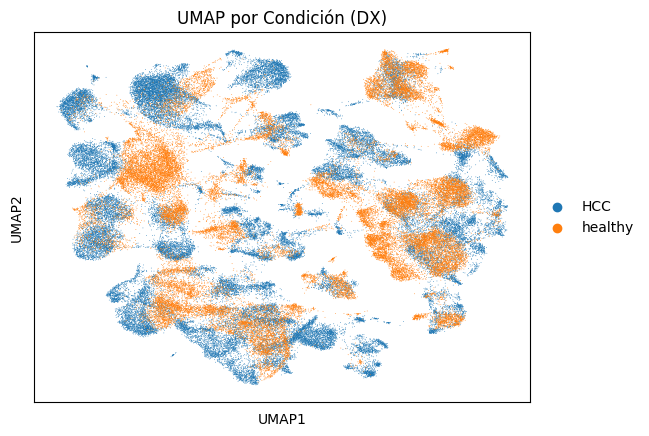

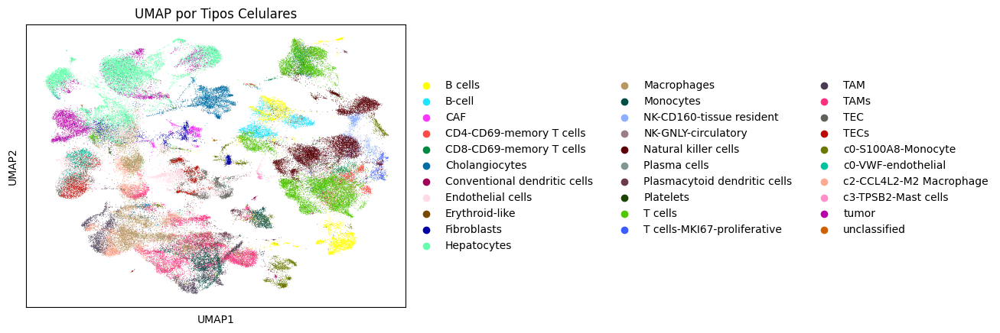

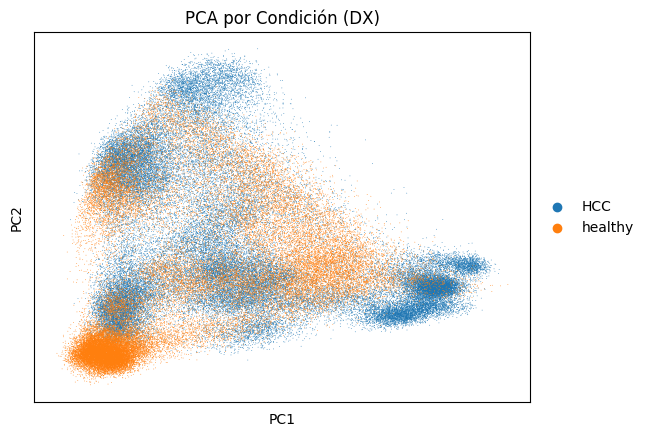

In [23]:
# Visualización del UMAP y PCA
sc.pl.umap(adata, color="DX", title="UMAP por Condición (DX)")
sc.pl.umap(adata, color="scVI_Model_Predictions", title="UMAP por Tipos Celulares")
sc.pl.pca(adata, color="DX", title="PCA por Condición (DX)")


In [24]:
sc.tl.leiden(adata, resolution=1.0)

In [25]:
adata.obs.groupby(['leiden', 'DX']).size().unstack().fillna(0).apply(lambda x: x / x.sum(), axis=1)

DX,HCC,healthy
leiden,,
0,0.909634,0.090366
1,0.433288,0.566712
2,0.004186,0.995814
3,0.313784,0.686216
4,0.780828,0.219172
5,0.462942,0.537058
6,0.503396,0.496604
7,0.554185,0.445815
8,0.292450,0.707550


In [26]:
adata.write_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/harmony_adata.h5ad')

In [27]:
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'scVI_Model_Predictions', 'dataset', 'leiden'
    var: 'n_cells-c_adata', 'n_cells-t_adata'
    uns: 'neighbors', 'umap', 'DX_colors', 'scVI_Model_Predictions_colors', 'pca', 'leiden'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# Setting Up Diferential Gene Expression Analysis with edgeR

In [28]:
adata = sc.read_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/harmony_adata.h5ad')
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'scVI_Model_Predictions', 'dataset', 'leiden'
    var: 'n_cells-c_adata', 'n_cells-t_adata'
    uns: 'DX_colors', 'leiden', 'neighbors', 'pca', 'scVI_Model_Predictions_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [29]:
replacements = {
    'B-cell': 'B cells',
    'TAM': 'TAMs',
    'TEC': 'TECs',
    'T cell': 'T cells',
    'cholangiocyte': 'Cholangiocytes',
    'hepatocyte': 'Hepatocytes'
}
adata.obs['scVI_Model_Predictions'] = adata.obs['scVI_Model_Predictions'].replace(replacements)
adata.obs['scVI_Model_Predictions'] = (
    adata.obs['scVI_Model_Predictions']
    .str.replace(' ', '_')
    .str.replace('-', '_')
)
cell_types_after_merge = adata.obs['scVI_Model_Predictions'].unique()
print(cell_types_after_merge)

['B_cells' 'CD4_CD69_memory_T_cells' 'TAMs' 'Cholangiocytes'
 'c3_TPSB2_Mast_cells' 'c0_S100A8_Monocyte' 'Hepatocytes'
 'c2_CCL4L2_M2_Macrophage' 'NK_CD160_tissue_resident'
 'NK_GNLY_circulatory' 'CAF' 'TECs' 'CD8_CD69_memory_T_cells' 'T_cells'
 'T_cells_MKI67_proliferative' 'c0_VWF_endothelial' 'tumor' 'unclassified'
 'Natural_killer_cells' 'Monocytes' 'Conventional_dendritic_cells'
 'Fibroblasts' 'Plasma_cells' 'Plasmacytoid_dendritic_cells'
 'Endothelial_cells' 'Macrophages' 'Platelets' 'Erythroid_like']


In [30]:
adata.var['n_cells'] = adata.var[['n_cells-c_adata', 'n_cells-t_adata']].fillna(0).sum(axis=1)
adata.var = adata.var.drop(columns=['n_cells-c_adata', 'n_cells-t_adata'])
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'DX', 'Sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'scVI_Model_Predictions', 'dataset', 'leiden'
    var: 'n_cells'
    uns: 'DX_colors', 'leiden', 'neighbors', 'pca', 'scVI_Model_Predictions_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [31]:
adata.obs['DX'] = adata.obs['DX'].str.replace(' ', '_')
dx_unique_values = adata.obs['DX'].unique()
print(dx_unique_values)

['HCC' 'healthy']


In [32]:
adata.obs = adata.obs.rename(columns={'scVI_Model_Predictions': 'cell_type'})
adata.obs = adata.obs.rename(columns={'DX': 'label'})
adata.obs = adata.obs.rename(columns={'Sample': 'sample'})
adata.obs

,Patient,label,sample,n_genes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,_scvi_batch,_scvi_labels,doublet,Batch,predicted,transfer_score,overcluster,cell_type,dataset,leiden
0-GSM7774395_2NT-t_adata,GSM7774395,HCC,GSM7774395_2NT,792,792,6.675823,6426.0,8.768263,78.493620,3.159041,0,0,False,GSM7774395_2NT,B cells,0.843435,13,B_cells,t_adata,12
1-GSM7774395_2NT-t_adata,GSM7774395,HCC,GSM7774395_2NT,940,940,6.846943,2707.0,7.903965,24.418175,9.937200,0,0,False,GSM7774395_2NT,T cells,0.654126,5,CD4_CD69_memory_T_cells,t_adata,1
2-GSM7774395_2NT-t_adata,GSM7774395,HCC,GSM7774395_2NT,1093,1093,6.997596,3229.0,8.080237,29.327965,10.684422,0,0,False,GSM7774395_2NT,TAM,0.966745,3,TAMs,t_adata,5
3-GSM7774395_2NT-t_adata,GSM7774395,HCC,GSM7774395_2NT,1068,1068,6.974479,3605.0,8.190354,26.047157,11.511789,0,0,False,GSM7774395_2NT,B cells,0.999950,22,B_cells,t_adata,21
4-GSM7774395_2NT-t_adata,GSM7774395,HCC,GSM7774395_2NT,1345,1345,7.204893,4208.0,8.344980,25.142586,6.250000,0,0,False,GSM7774395_2NT,c0-S100A8-Monocyte,0.987608,26,TAMs,t_adata,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCATCGATG-1-GSM7883930_PBC001-c_adata,GSM7883930,healthy,GSM7883930_PBC001,283,283,5.648974,611.0,6.416732,47.626841,37.643208,0,0,False,GSM7883930_PBC001,fibroblast,0.999989,4,Hepatocytes,c_adata,2
TTTGTCATCCGCGTTT-1-GSM7883930_PBC001-c_adata,GSM7883930,healthy,GSM7883930_PBC001,699,699,6.551080,1575.0,7.362645,32.253968,24.825397,0,0,False,GSM7883930_PBC001,endothelial cell,0.993612,19,Endothelial_cells,c_adata,22
TTTGTCATCGCACTCT-1-GSM7883930_PBC001-c_adata,GSM7883930,healthy,GSM7883930_PBC001,3178,3178,8.064322,10247.0,9.234838,24.202206,15.184932,0,0,False,GSM7883930_PBC001,cholangiocyte,1.000000,17,Cholangiocytes,c_adata,13
TTTGTCATCTACCAGA-1-GSM7883930_PBC001-c_adata,GSM7883930,healthy,GSM7883930_PBC001,2726,2726,7.910957,8489.0,9.046644,16.597950,6.785251,0,0,False,GSM7883930_PBC001,monocyte,0.999998,8,Monocytes,c_adata,6


In [33]:
adata.write_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/harmony_adata.h5ad')

In [34]:
cell_types = adata.obs['cell_type'].unique()
for cell_type in cell_types:
    print(cell_type)


B_cells
CD4_CD69_memory_T_cells
TAMs
Cholangiocytes
c3_TPSB2_Mast_cells
c0_S100A8_Monocyte
Hepatocytes
c2_CCL4L2_M2_Macrophage
NK_CD160_tissue_resident
NK_GNLY_circulatory
CAF
TECs
CD8_CD69_memory_T_cells
T_cells
T_cells_MKI67_proliferative
c0_VWF_endothelial
tumor
unclassified
Natural_killer_cells
Monocytes
Conventional_dendritic_cells
Fibroblasts
Plasma_cells
Plasmacytoid_dendritic_cells
Endothelial_cells
Macrophages
Platelets
Erythroid_like


In [35]:
for pat in adata.obs['sample'].cat.categories:
    sizer = (pat == adata.obs['sample']).sum()
    print(f'{sizer} of {pat}')

7240 of GSM6942879_non-tumor
13342 of GSM6942881_tumor
5760 of GSM7774394_1NT
5712 of GSM7774395_2NT
2452 of GSM7774396_3NT
8152 of GSM7774397_4NT
4676 of GSM7774398_5NT
8186 of GSM7774402_4T
5584 of GSM7774403_5T
13833 of GSM7883930_PBC001
20227 of GSM7883932_PBC005


In [36]:
type_label = "cell_type"
adata.obs[type_label] = [ct.replace(" ", "_") for ct in adata.obs[type_label]]
adata.obs[type_label] = [ct.replace("+", "") for ct in adata.obs[type_label]]

In [37]:
adata.obs["sample"] = adata.obs["sample"].astype("category")
adata.obs[type_label] = adata.obs[type_label].astype("category")

In [38]:
NUM_OF_CELL_PER_DONOR = 20
import random

def aggregate_and_filter(
    adata,
    cell_identity,
    donor_key="sample",
    condition_key="label",
    cell_identity_key="cell_type",
    obs_to_keep=[],  # which additional metadata to keep, e.g. gender, age, etc.
    replicates_per_patient=3,
):
    obs_to_keep = list(set(obs_to_keep) | set([donor_key, condition_key]))
    # subset adata to the given cell identity
    adata_cell_pop = adata[adata.obs[cell_identity_key] == cell_identity].copy()
    # check which donors to keep according to the number of cells specified with NUM_OF_CELL_PER_DONOR
    size_by_donor = adata_cell_pop.obs.groupby([donor_key]).size()
    donors_to_drop = [
        donor
        for donor in size_by_donor.index
        if size_by_donor[donor] <= NUM_OF_CELL_PER_DONOR
    ]
    if len(donors_to_drop) > 0:
        print("Dropping the following samples:")
        print(donors_to_drop)
    df = pd.DataFrame(columns=[*adata_cell_pop.var_names, *obs_to_keep])

    adata_cell_pop.obs[donor_key] = adata_cell_pop.obs[donor_key].astype("category")
    for i, donor in enumerate(donors := adata_cell_pop.obs[donor_key].cat.categories):
        print(f"\tProcessing donor {i+1} out of {len(donors)}...", end="\r")
        if donor not in donors_to_drop:
            adata_donor = adata_cell_pop[adata_cell_pop.obs[donor_key] == donor]
            # create replicates for each donor
            indices = list(adata_donor.obs_names)
            random.shuffle(indices)
            indices = np.array_split(np.array(indices), replicates_per_patient)
            for i, rep_idx in enumerate(indices):
                adata_replicate = adata_donor[rep_idx]
                # specify how to aggregate: sum gene expression for each gene for each donor and also keep the condition information
                agg_dict = {gene: "sum" for gene in adata_replicate.var_names}
                for obs in obs_to_keep:
                    agg_dict[obs] = "first"
                
                # create a df with all genes, donor and condition info
                df_donor = pd.DataFrame(adata_replicate.X.A)
                df_donor.index = adata_replicate.obs_names
                df_donor.columns = adata_replicate.var_names
                df_donor = df_donor.join(adata_replicate.obs[obs_to_keep])
                # aggregate
                df_donor = df_donor.groupby(donor_key).agg(agg_dict)
                df_donor[donor_key] = donor
                df.loc[f"{donor}_{i}"] = df_donor.loc[donor]
                print(df.drop(columns=adata_cell_pop.var_names))
    print("\n")
    # create AnnData object from the df
    adata_cell_pop = sc.AnnData(
        df[adata_cell_pop.var_names], obs=df.drop(columns=adata_cell_pop.var_names)
    )
    return adata_cell_pop

In [39]:
%%R
fit_model <- function(adata_){
    # create an edgeR object with counts and grouping factor
    y <- DGEList(assay(adata_, "X"), group = colData(adata_)$label)
    # filter out genes with low counts
    print("Dimensions before subsetting:")
    print(dim(y))
    print("")
    keep <- filterByExpr(y)
    y <- y[keep, , keep.lib.sizes=FALSE]
    print("Dimensions after subsetting:")
    print(dim(y))
    print("")
    # normalize
    y <- calcNormFactors(y)
    # create a vector that is concatentation of condition and cell type that we will later use with contrasts
    group <- paste0(colData(adata_)$label, ".", colData(adata_)$cell_type)
    # replicate <- colData(adata_)$replicate
    # create a design matrix: even though we have multiple donors we dont have normal and lunk form the same donor
    # so we dont consider this becuase it would lead to correlations in the coeffcients that would reduce the ranl
    # of the matrix
    design <- model.matrix(~ 0 + group)
    # estimate dispersion
    y <- estimateDisp(y, design = design)
    # fit the model
    fit <- glmQLFit(y, design)
    return(list("fit"=fit, "design"=design, "y"=y))
}


In [40]:
obs_to_keep = ["label", type_label, "sample"]

In [41]:
adata.X = adata.layers["counts"].copy()

In [42]:
import concurrent.futures
# Process the remaining cell types concurrently

cell_types = adata.obs[type_label].cat.categories

def process_cell_type(adata, cell_type, type_label, obs_to_keep, replicates_per_patient):
    # print(f'Processing {cell_type}...')
    return aggregate_and_filter(adata, cell_type, obs_to_keep=obs_to_keep,
                                replicates_per_patient=replicates_per_patient)


adata_pb = None
with concurrent.futures.ProcessPoolExecutor() as executor:
    futures = []
    for cell_type in cell_types:
        print(f'Processing {cell_type}...')
        future = executor.submit(process_cell_type, adata, cell_type,
                               type_label, obs_to_keep, 3)
        futures.append(future)

    for i, future in enumerate(concurrent.futures.as_completed(futures)):
        print(f'Finished {cell_types[i]}...')
        adata_cell_type = future.result()
        
        if i==0:
            adata_pb = adata_cell_type
        else:
            adata_pb = adata_pb.concatenate(adata_cell_type)

adata_pb

Processing B_cells...
Processing CAF...
Processing CD4_CD69_memory_T_cells...
Processing CD8_CD69_memory_T_cells...
Processing Cholangiocytes...
Processing Conventional_dendritic_cells...
Processing Endothelial_cells...
Processing Erythroid_like...
Processing Fibroblasts...
Processing Hepatocytes...
Processing Macrophages...
Processing Monocytes...
Processing NK_CD160_tissue_resident...
Processing NK_GNLY_circulatory...
Processing Natural_killer_cells...
Processing Plasma_cells...
Processing Plasmacytoid_dendritic_cells...
Processing Platelets...
Processing TAMs...
Processing TECs...
Processing T_cells...
Processing T_cells_MKI67_proliferative...
Processing c0_S100A8_Monocyte...
Processing c0_VWF_endothelial...
Processing c2_CCL4L2_M2_Macrophage...
Processing c3_TPSB2_Mast_cells...
Processing tumor...
Processing unclassified...
                       cell_type    label                sample
GSM6942879_non-tumor_0   B_cells  healthy  GSM6942879_non-tumor
                       cell_type

AnnData object with n_obs × n_vars = 423 × 15404
    obs: 'cell_type', 'label', 'sample', 'batch'

In [43]:
adata_pb


AnnData object with n_obs × n_vars = 423 × 15404
    obs: 'cell_type', 'label', 'sample', 'batch'

In [44]:
adata_pb.obs["replicate"] = [str(namer.split('_')[0][:5] + namer.split('_')[0][-5:]) for namer in adata_pb.obs.index]
adata_pb.obs["replicate"] = adata_pb.obs["replicate"].astype(str).astype("category")


# we use this to avoid stopping if origin was already deleted
#try:
#adata_pb.obs["label"] = adata_pb.obs["label"].str[:4]
adata_pb.obs["label"] = adata_pb.obs["label"].astype(str).astype("category")
#except Exception:
 #   pass

adata_pb.obs["sample"] = adata_pb.obs["replicate"].astype(str) + \
    '_' + adata_pb.obs["label"].astype(str) + \
    '_' + adata_pb.obs["batch"].astype(str)

adata_pb.obs["sample"] = adata_pb.obs["sample"].astype(str).astype("category")

#try:
adata_pb.obs["cell_type"] = adata_pb.obs[type_label].astype(str).astype("category")
#    del adata_pb.obs[type_label]
#except Exception:
#    pass

# We create a list of the categories to extract the cat number
# and add it to the end of the sample
cats = list(adata_pb.obs['cell_type'].cat.categories)
cell_type_indices = adata_pb.obs['cell_type'].apply(lambda x: cats.index(x))
indices = adata_pb.obs['sample'].astype(str) + '_' + cell_type_indices.astype(str)

adata_pb.obs.index = indices
del indices

adata_pb.obs


,cell_type,label,sample,batch,replicate
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM7883930_healthy_0_5,Conventional_dendritic_cells,healthy,GSM7883930_healthy_0,0,GSM7883930
GSM7883930_healthy_0_5,Conventional_dendritic_cells,healthy,GSM7883930_healthy_0,0,GSM7883930
...,...,...,...,...,...
GSM7774402_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774402_HCC_1,1,GSM7774402
GSM7774402_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774402_HCC_1,1,GSM7774402
GSM7774403_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774403_HCC_1,1,GSM7774403
GSM7774403_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774403_HCC_1,1,GSM7774403


In [45]:
adata_pb.X = adata_pb.X.astype('float')
adata_pb.write_h5ad('/datos/home/mdiaz/sc_liver_data/checkpoints/3_pp_DGEA.h5ad')
adata_pb.obs

,cell_type,label,sample,batch,replicate
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM6942879_healthy_0_5,Conventional_dendritic_cells,healthy,GSM6942879_healthy_0,0,GSM6942879
GSM7883930_healthy_0_5,Conventional_dendritic_cells,healthy,GSM7883930_healthy_0,0,GSM7883930
GSM7883930_healthy_0_5,Conventional_dendritic_cells,healthy,GSM7883930_healthy_0,0,GSM7883930
...,...,...,...,...,...
GSM7774402_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774402_HCC_1,1,GSM7774402
GSM7774402_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774402_HCC_1,1,GSM7774402
GSM7774403_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774403_HCC_1,1,GSM7774403
GSM7774403_HCC_1_23,c2_CCL4L2_M2_Macrophage,HCC,GSM7774403_HCC_1,1,GSM7774403


In [46]:
adata_pb

AnnData object with n_obs × n_vars = 423 × 15404
    obs: 'cell_type', 'label', 'sample', 'batch', 'replicate'

In [47]:
adata_pb.layers['counts'] = adata_pb.X.copy()
sc.pp.normalize_total(adata_pb, target_sum=1e6)
sc.pp.log1p(adata_pb)
sc.pp.pca(adata_pb)

In [48]:
adata_pb.obs["lib_size"] = np.sum(adata_pb.layers["counts"], axis=1)
adata_pb.obs["log_lib_size"] = np.log(adata_pb.obs["lib_size"])

In [49]:
adata_pb.obs['cell_type'] = adata_pb.obs['cell_type'].replace({'B_cell': 'B_cells'})
print(adata_pb.obs['cell_type'].unique())

['Conventional_dendritic_cells', 'CD4_CD69_memory_T_cells', 'Endothelial_cells', 'CAF', 'Fibroblasts', ..., 'tumor', 'T_cells_MKI67_proliferative', 'T_cells', 'c0_S100A8_Monocyte', 'c2_CCL4L2_M2_Macrophage']
Length: 27
Categories (27, object): ['B_cells', 'CAF', 'CD4_CD69_memory_T_cells', 'CD8_CD69_memory_T_cells', ..., 'c2_CCL4L2_M2_Macrophage', 'c3_TPSB2_Mast_cells', 'tumor', 'unclassified']


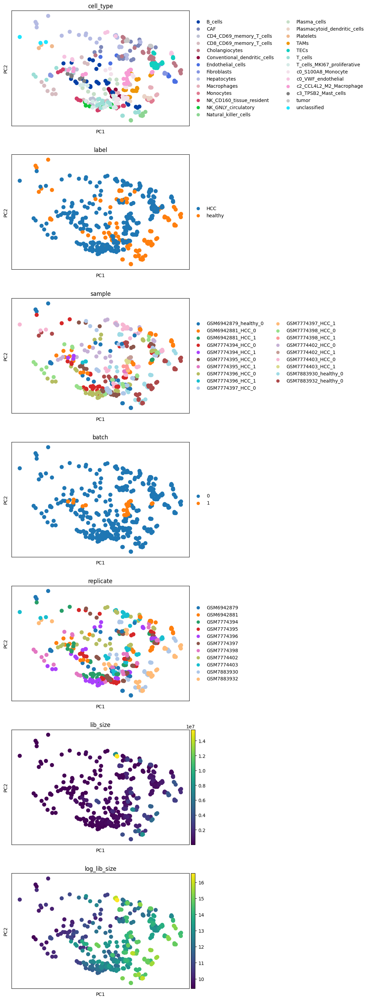

In [50]:
sc.pl.pca(adata_pb, color=adata_pb.obs, size=300, ncols=1)

In [51]:
adata_pb.obs['batch'].unique()

['0', '1']
Categories (2, object): ['0', '1']

# One group

First we will show how to prepare your data, constructing a design matrix and performing a DE testing for **hepatocytes**. 

In [94]:
adata_pb.X = adata_pb.layers['counts'].copy()
adata_hepa = adata_pb[adata_pb.obs['cell_type'] == "Hepatocytes"]
adata_hepa.obs = adata_hepa.obs.drop(columns='batch')
adata_hepa

AnnData object with n_obs × n_vars = 27 × 15404
    obs: 'cell_type', 'label', 'sample', 'replicate', 'lib_size', 'log_lib_size'
    uns: 'log1p', 'pca', 'cell_type_colors', 'label_colors', 'sample_colors', 'batch_colors', 'replicate_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [95]:
%%time
%%R -i adata_hepa
outs <-fit_model(adata_hepa)


[1] "Dimensions before subsetting:"
[1] 15404    27
[1] ""
[1] "Dimensions after subsetting:"
[1] 8289   27
[1] ""


Repeated column names found in count matrix


CPU times: user 3.62 s, sys: 128 ms, total: 3.75 s
Wall time: 2.92 s


In [96]:
%%R
fit <- outs$fit
y <- outs$y

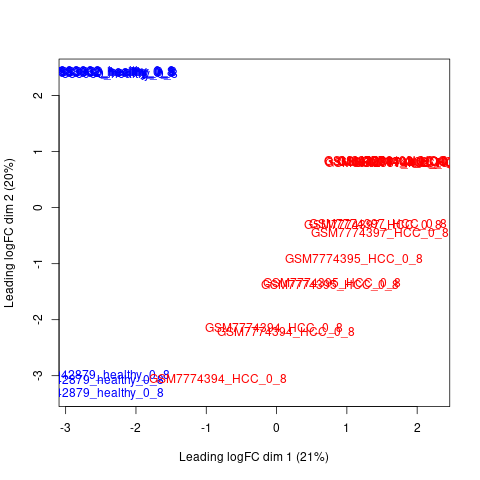

In [97]:
%%R
plotMDS(y, col=ifelse(y$samples$group == "healthy", "blue", "red"))

Biological Coefficient of Variation (BCV) plots show the variability of every gene on average across biological groups as a function of mean expression. For example, bcv of 0.3 indicates that there is on average 30% percent variability in the expression of genes across groups.

Genes with low abundace generally exhibit larger BCV as read count measurements are more uncertain for low abundance genes. On the other hand, genes with high average expression are quantified more reliably, thus they generally have lower variability and hence lower BCV. Use this plot to detect outlier genes or pinpoint other experimental factors that may need to be reflected in the design matrix. For example, a group of genes with high average expression and high BCV appearing in the top right corner of the plot can flag experimental stress, contamination etc, particularly if they belong to similar gene families.

BCV is the square root of dispersion. The distance between tagwise and common bcv trend indicate if tagwise (gene-wise) dispersion estimates are highly variable (i.e. heterogenous gene expression). If tag-wise dispersion values are very heterogenous, less moderation is applied to capture heterogenity. The distance between any two points on those curves reflects how much the dispersion for a gene was shrunken towards the common trend. That is, it captures the amount of dispersion moderation applied.

In the BCV plot below, we see some low abundance genes with high bcv, but no high abundance genes with high bcv, which indicates that there should not be any further experimental considerations modelled into the design matrix.

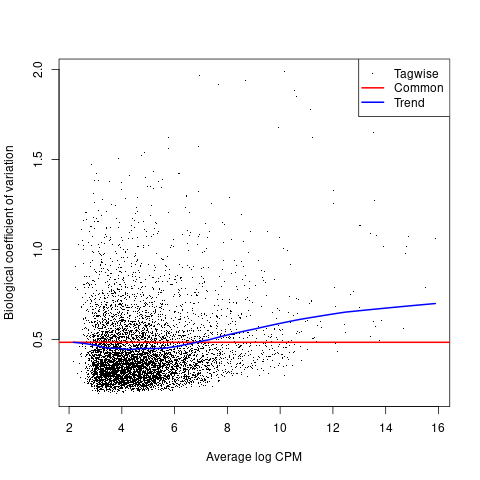

In [98]:
%%R
plotBCV(y)

Next, we perform the quasi-likelihood test to find DE genes between control and stimulated conditions. Let’s check what columns our design matrix has to specify the correct columns to test on.

In [99]:
%%R
colnames(y$design)

[1] "groupHCC.Hepatocytes"     "grouphealthy.Hepatocytes"


In [100]:
%%R -o tt
myContrast <- makeContrasts('groupHCC.Hepatocytes-grouphealthy.Hepatocytes', levels = y$design)
qlf <- glmQLFTest(fit, contrast=myContrast)
# get all of the DE genes and calculate Benjamini-Hochberg adjusted FDR
tt <- topTags(qlf, n = Inf)
tt <- tt$table

In [101]:
tt.shape

(8289, 5)

In [102]:
tt[:5]

,logFC,logCPM,F,PValue,FDR
AGXT,-14.820960,8.506769,1270.244147,2.203989e-19,1.826887e-15
HPD,-15.225457,8.924688,1153.394023,5.572752e-19,2.309627e-15
SULT2A1,-13.682311,7.332440,1057.644699,1.348061e-18,3.724693e-15
FXYD1,-13.557223,7.125136,986.391437,2.652858e-18,5.497386e-15
CFHR1,-12.874298,6.412238,943.527885,3.993865e-18,6.052847e-15


We can see that AADAC, TUG1, GAS5, and RNF128 are up-regulated in tumor cells. 

You can also set a threshold for logFC that one wants to look for. The function glmTreat, shrinks the coefficients of those below the threshold to zero. And after that it does hypothesis testing on distribution of F values.

In addition: Warning message:
In plot.xy(xy.coords(x, y), type = type, ...) :
  "panel.first" is not a graphical parameter


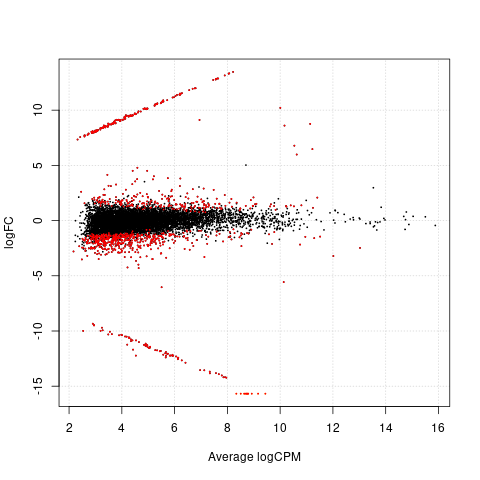

In [61]:
%%R
plotSmear(qlf, de.tags = rownames(tt)[which(tt$FDR<0.01)])

# Multiple groups

Now, we will prepare the data to construct the design matrix and DE test using the full database of cell types. We will exlude adjacent tumor tissue and compare tumor tissue VS healthy liver tissue.


In [104]:
adata_pb = adata_pb[adata_pb.obs['label'].isin(['HCC', 'healthy'])]

In [90]:
%%time
%%R -i adata_pb
outs <-fit_model(adata_pb)

[1] "Dimensions before subsetting:"
[1] 15404   423
[1] ""
[1] "Dimensions after subsetting:"
[1] 6886  423
[1] ""


Repeated column names found in count matrix


CPU times: user 1min 3s, sys: 448 ms, total: 1min 3s
Wall time: 1min 2s


In [91]:
%%R
fit <- outs$fit
y <- outs$y

In [92]:
%%R
ctypes = as.vector(sapply(sapply(colnames(y$design), strsplit, split='\\.'), '[', 2))
paired_types  = ctypes[duplicated(ctypes)]
print(paired_types)

[1] "B_cells"        "Cholangiocytes" "Hepatocytes"    "T_cells"       


In [93]:
%%R
design <- y$design
colnames(design)

 [1] "groupHCC.B_cells"                         
 [2] "groupHCC.c0_S100A8_Monocyte"              
 [3] "groupHCC.c0_VWF_endothelial"              
 [4] "groupHCC.c2_CCL4L2_M2_Macrophage"         
 [5] "groupHCC.c3_TPSB2_Mast_cells"             
 [6] "groupHCC.CAF"                             
 [7] "groupHCC.CD4_CD69_memory_T_cells"         
 [8] "groupHCC.CD8_CD69_memory_T_cells"         
 [9] "groupHCC.Cholangiocytes"                  
[10] "groupHCC.Hepatocytes"                     
[11] "groupHCC.NK_CD160_tissue_resident"        
[12] "groupHCC.NK_GNLY_circulatory"             
[13] "groupHCC.T_cells"                         
[14] "groupHCC.T_cells_MKI67_proliferative"     
[15] "groupHCC.TAMs"                            
[16] "groupHCC.TECs"                            
[17] "groupHCC.tumor"                           
[18] "groupHCC.unclassified"                    
[19] "grouphealthy.B_cells"                     
[20] "grouphealthy.Cholangiocytes"              
[21] "grouphealthy.C

In [67]:
%%R -i adata_pb -o de_per_cell_type
de_per_cell_type <- list()
ctypes = as.vector(sapply(sapply(colnames(y$design), strsplit, split='\\.'), '[', 2))
paired_types  = ctypes[duplicated(ctypes)]

for (cell_type in paired_types) {    
    # Ajustar el grupo para solo las células que tienen tanto tumor como normal
    group <- paste0(colData(adata_pb)$label, ".", colData(adata_pb)$cell_type)
    
    # Crear la matriz de diseño
    design <- model.matrix(~ 0 + group)
    print(colnames(design))  # Verificar los nombres después del reemplazo

    # Crear el contraste con los nombres corregidos
    myContrast <- makeContrasts(paste0("groupHCC.", cell_type, " - grouphealthy.", cell_type), levels = design)
    
    # Realizar el test QLF
    qlf <- glmQLFTest(fit, contrast=myContrast)
    
    # Obtener todos los genes diferencialmente expresados y calcular el FDR ajustado de Benjamini-Hochberg
    tt <- topTags(qlf, n = Inf)
    
    # Guardar los resultados en la lista para cada tipo de célula
    de_per_cell_type[[cell_type]] <- tt$table
}


 [1] "groupHCC.B_cells"                         
 [2] "groupHCC.c0_S100A8_Monocyte"              
 [3] "groupHCC.c0_VWF_endothelial"              
 [4] "groupHCC.c2_CCL4L2_M2_Macrophage"         
 [5] "groupHCC.c3_TPSB2_Mast_cells"             
 [6] "groupHCC.CAF"                             
 [7] "groupHCC.CD4_CD69_memory_T_cells"         
 [8] "groupHCC.CD8_CD69_memory_T_cells"         
 [9] "groupHCC.Cholangiocytes"                  
[10] "groupHCC.Hepatocytes"                     
[11] "groupHCC.NK_CD160_tissue_resident"        
[12] "groupHCC.NK_GNLY_circulatory"             
[13] "groupHCC.T_cells"                         
[14] "groupHCC.T_cells_MKI67_proliferative"     
[15] "groupHCC.TAMs"                            
[16] "groupHCC.TECs"                            
[17] "groupHCC.tumor"                           
[18] "groupHCC.unclassified"                    
[19] "grouphealthy.B_cells"                     
[20] "grouphealthy.Cholangiocytes"              
[21] "grouphealthy.C

In [113]:
# get cell types that we ran the analysis for
cell_types = de_per_cell_type.keys()
# add the table to .uns for each cell type
for cell_type in cell_types:
    df = de_per_cell_type[cell_type]
    df["gene_symbol"] = df.index
    df["cell_type"] = cell_type
    sc_toolbox.tools.de_res_to_anndata(
        adata,
        df,
        groupby="cell_type",
        score_col="logCPM",
        pval_col="PValue",
        pval_adj_col="FDR",
        lfc_col="logFC",
        key_added="edgeR_" + cell_type,
    )
    df.to_csv(f"/home/mdiaz/sc_liver_data/DGE_files/DGE_{cell_type}.csv")


In [69]:
sc.get.rank_genes_groups_df(adata, group="Hepatocytes", key="edgeR_Hepatocytes")[
    :20
]

,names,scores,logfoldchanges,pvals,pvals_adj
0,MALAT1,14.829108,0.413874,0.091163,0.197157
1,MT-CO1,14.767087,-0.307046,0.301204,0.466611
2,IGKC,14.52585,6.418531,0.0,0.000002
3,MT-CO3,13.896614,0.504835,0.071517,0.165758
4,B2M,13.881157,1.071283,0.000006,0.000101
5,FTL,13.590405,0.124453,0.684257,0.800075
6,MT-ND4,13.566474,0.911213,0.002038,0.010972
7,MT-ATP6,13.508034,0.21146,0.466282,0.624066
8,MT-CYB,13.475588,-0.217358,0.476197,0.633274
9,MT-CO2,13.435511,-0.652358,0.025475,0.076205


In [70]:
# Filtrar solo hepatocitos
hepatocytes = adata[adata.obs['cell_type'] == 'Hepatocytes']

# Contar cuántos hepatocitos hay en cada condición
hepatocyte_counts = hepatocytes.obs.groupby('label').size()
print(hepatocyte_counts)


label
HCC        9230
healthy    4059
dtype: int64


In [71]:
# Filtrar pseudobulks de hepatocitos en adata_pb
hepatocyte_pseudobulks = adata_pb[adata_pb.obs['cell_type'] == 'Hepatocytes']

# Contar cuántos pseudobulks de hepatocitos hay en cada condición
pseudobulk_counts = hepatocyte_pseudobulks.obs.groupby('label').size()
print(pseudobulk_counts)


label
HCC        18
healthy     9
dtype: int64


In [72]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

In [73]:
# Filtrar las claves de adata.uns que comienzan con 'edgeR_'
edgeR_keys = [key for key in adata.uns.keys() if key.startswith('edgeR_')]

# Ver las claves encontradas
print(edgeR_keys)

['edgeR_B_cells', 'edgeR_Cholangiocytes', 'edgeR_Hepatocytes', 'edgeR_T_cells']


## Getting top 10 genes from B cells, Cholangiocytes, Hepatocytes and T cells

In [74]:
def get_top_genes_significant(adata, cell_type_key, num_genes=10, fdr_threshold=0.05):
    # Recuperar los genes diferencialmente expresados para el tipo celular dado
    df = sc.get.rank_genes_groups_df(adata, group=cell_type_key, key=f'edgeR_{cell_type_key}')
    
    # Asegurarse de que 'logfoldchanges' es numérico, convirtiendo y manejando errores
    df['logfoldchanges'] = pd.to_numeric(df['logfoldchanges'], errors='coerce')
    
    # Aplicar el filtro FDR < 0.05 para seleccionar genes significativos
    significant_genes_df = df[df['pvals_adj'] < fdr_threshold]
    
    # Ordenar por log-fold change en orden descendente y seleccionar los top 10 entre los significativos
    top_genes_df = significant_genes_df.nlargest(num_genes, 'logfoldchanges')
    
    return top_genes_df

# Recuperar los 10 genes más expresados y significativos para cada tipo celular
top_hepatocytes = get_top_genes_significant(adata, 'Hepatocytes')
top_b_cells = get_top_genes_significant(adata, 'B_cells')
top_cholangiocytes = get_top_genes_significant(adata, 'Cholangiocytes')
top_t_cells = get_top_genes_significant(adata, 'T_cells')

# Mostrar los resultados
print("Top Significant Genes in Hepatocytes:")
print(top_hepatocytes)
print("\nTop Significant Genes in B Cells:")
print(top_b_cells)
print("\nTop Significant Genes in Cholangiocytes:")
print(top_cholangiocytes)
print("\nTop Significant Genes in T Cells:")
print(top_t_cells)

Top Significant Genes in Hepatocytes:
        names    scores  logfoldchanges pvals pvals_adj
2170    ITIH3  6.204849       12.536643   0.0       0.0
3565   UGT2B7  5.540014       12.350841   0.0       0.0
2778    ITIH1  5.889449       12.342784   0.0       0.0
1296   PTP4A1    6.8531       12.213775   0.0       0.0
2822     G6PC  5.864747       11.953885   0.0       0.0
2888   AKR1C2  5.836608       11.861291   0.0       0.0
5154  PPP1R1A  4.976148       11.069375   0.0       0.0
804     SNHG5  7.420409       10.504765   0.0       0.0
738     SNHG6  7.538326       10.496166   0.0       0.0
1059     GAS5  7.099877       10.309520   0.0       0.0

Top Significant Genes in B Cells:
           names     scores  logfoldchanges pvals pvals_adj
15         IGHG4  12.665149       12.158275   0.0       0.0
1059        GAS5   7.099877       11.121691   0.0       0.0
738        SNHG6   7.538326       11.083956   0.0       0.0
804        SNHG5   7.420409       11.059973   0.0       0.0
1334  PCED1

In [75]:
top_hepatocytes['cell_type'] = 'Hepatocytes'
top_b_cells['cell_type'] = 'B_cells'
top_cholangiocytes['cell_type'] = 'Cholangiocytes'
top_t_cells['cell_type'] = 'T_cells'

# Concatenar todos los DataFrames en uno solo
top_genes_all_types = pd.concat([top_hepatocytes, top_b_cells, top_cholangiocytes, top_t_cells])

# Guardar el DataFrame concatenado en un archivo CSV
top_genes_all_types.to_csv('top_genes_significant_all_types.csv', index=False)

## Visualizing top genes for each cell type

In [115]:
prueba = pd.read_csv('/home/mdiaz/sc_liver_data/DGE_files/DGE_B_cells.csv')
prueba.head()

,Unnamed: 0,logFC,logCPM,F,PValue,FDR,gene_symbol,cell_type
0,GAS5,11.121691,7.099877,505.586472,9.432017e-67,6.494887e-63,GAS5,B_cells
1,ATP6V0C,-10.273350,6.205217,1324.923285,9.432456e-63,3.247594e-59,ATP6V0C,B_cells
2,OGA,-10.725160,5.270705,872.007737,7.585572e-55,1.741142e-51,OGA,B_cells
3,ARL6IP4,-10.445831,5.835567,841.320470,1.349617e-53,2.323366e-50,ARL6IP4,B_cells
4,TUT4,-10.701218,4.958470,735.206205,5.791872e-52,7.976566e-49,TUT4,B_cells


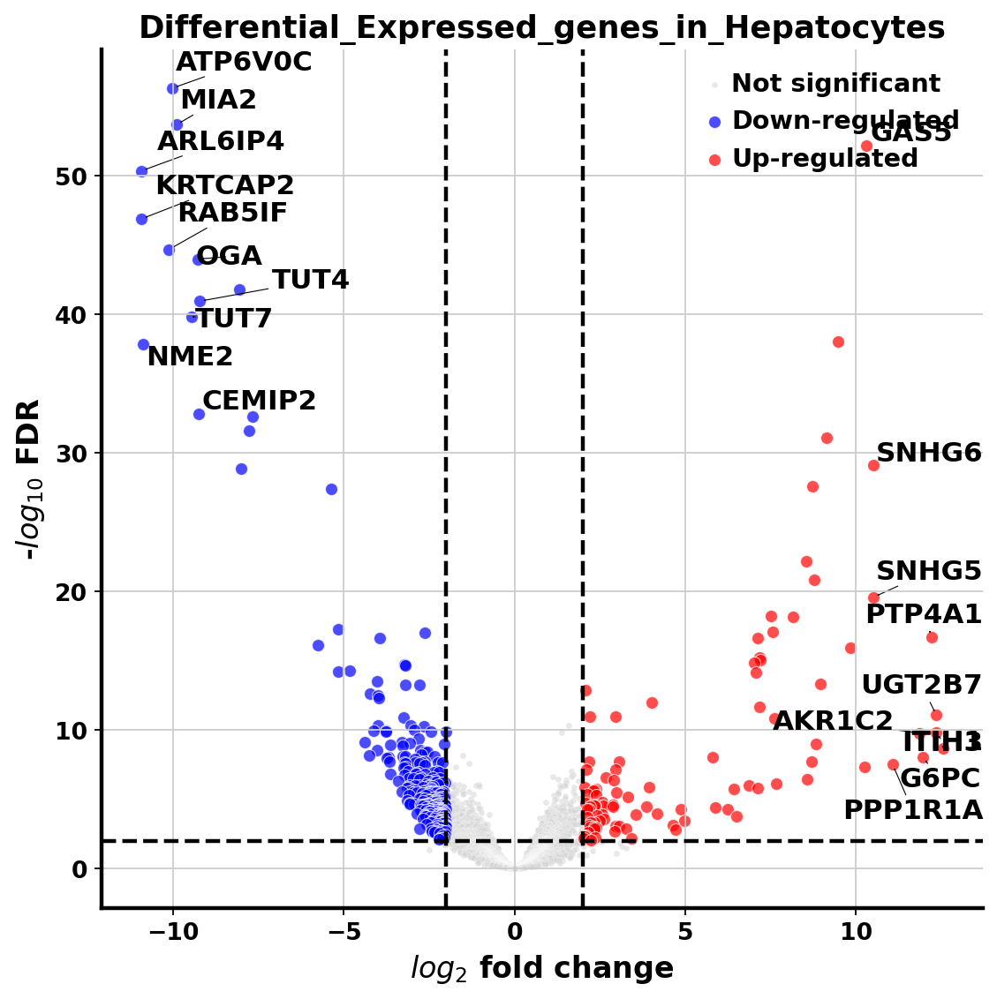

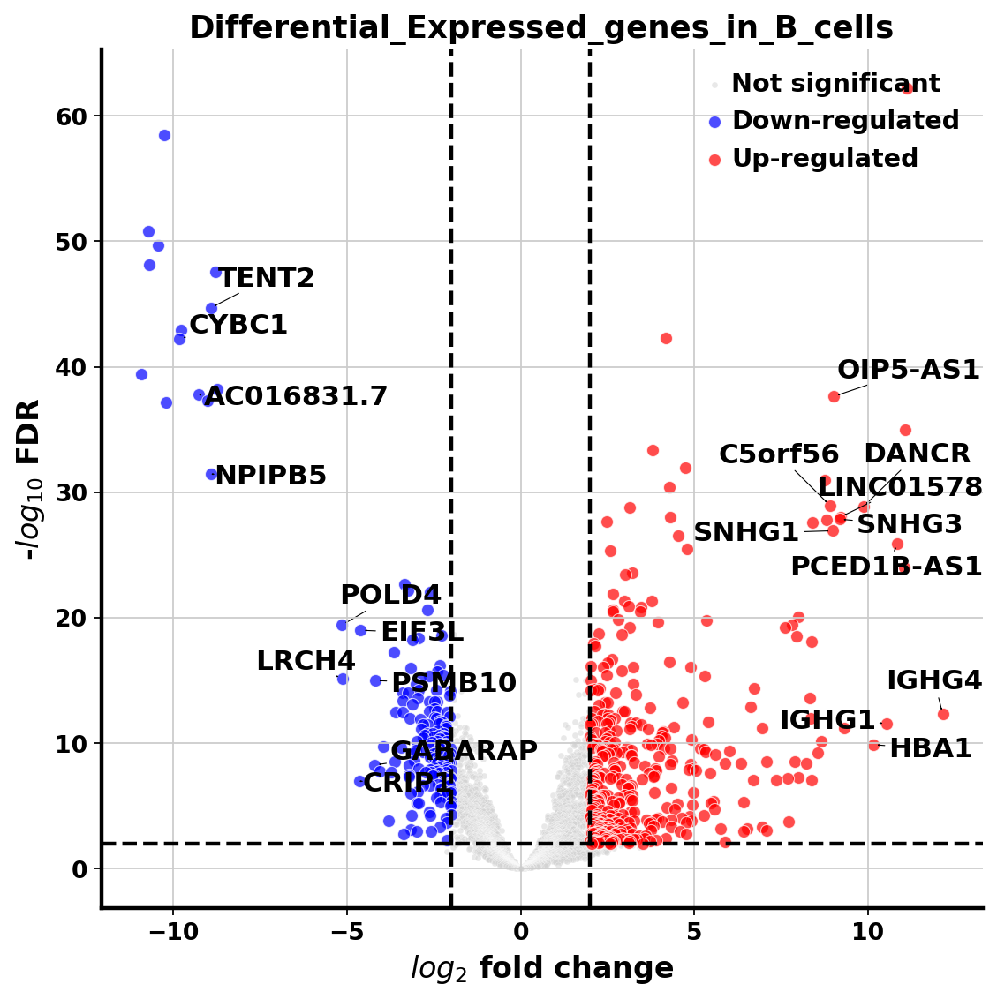

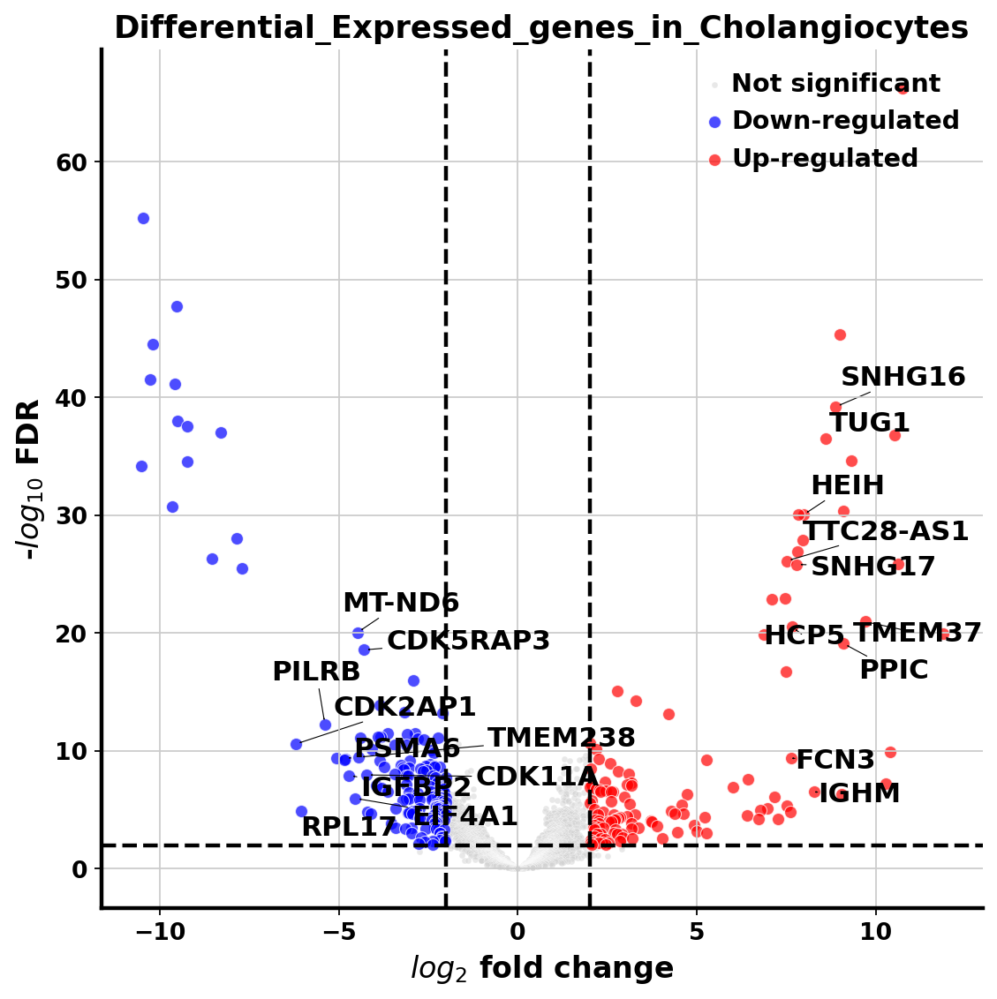

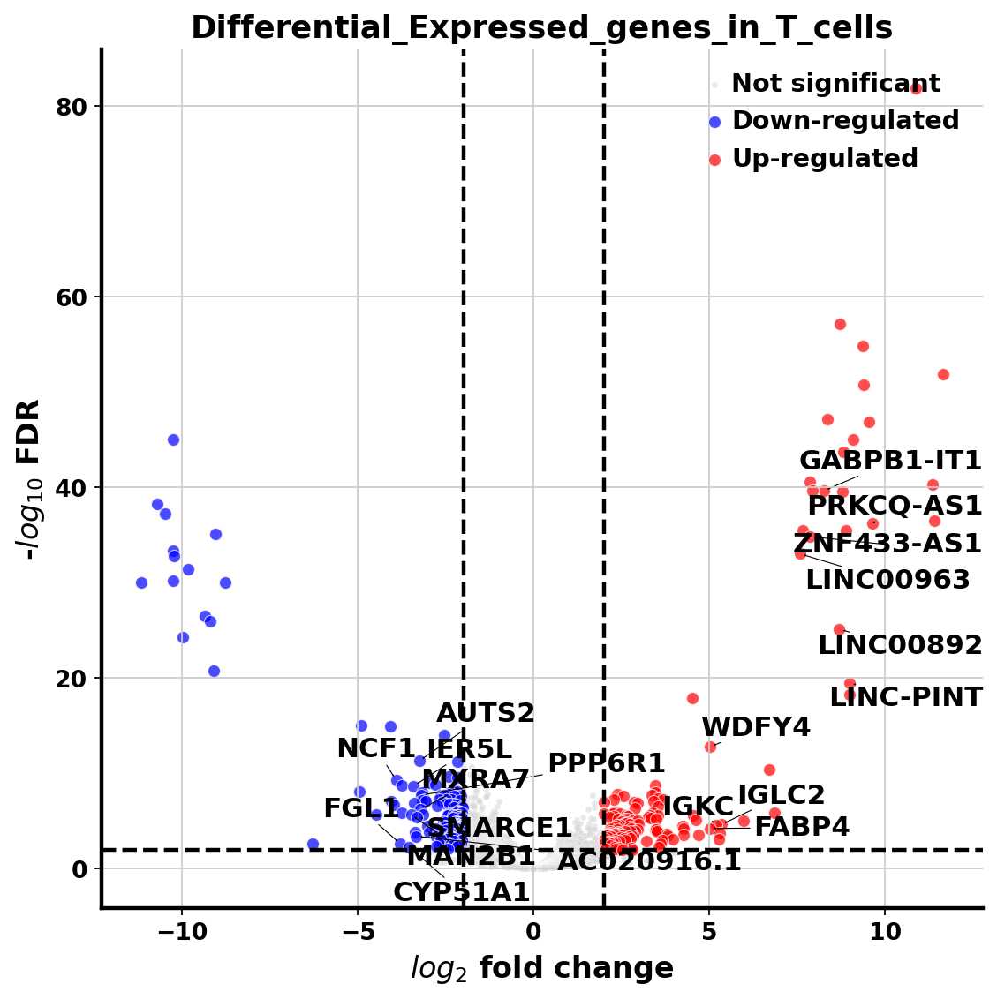

In [120]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from adjustText import adjust_text
import pandas as pd

# Definir umbrales para log-fold change y p-valor ajustado
LOG_FOLD_CHANGE_THRESHOLD = 2
PVAL_ADJ_THRESHOLD = 0.01

# Conjunto para almacenar nombres de genes etiquetados previamente
labeled_genes = set()

def enhanced_volcano_plot(csv_path, cell_type, title=None):
    global labeled_genes  # Accedemos al conjunto global de genes etiquetados
    
    # Leer los datos del CSV
    result = pd.read_csv(csv_path)
    
    # Asegurarnos de que 'logFC' es numérico
    result['logFC'] = pd.to_numeric(result['logFC'], errors='coerce')
    result['-log10(FDR)'] = -np.log10(result['FDR'].astype(float).fillna(1))
    
    # Filtrar para obtener genes up-regulated, down-regulated y no significativos
    upregulated_genes = result[(result["logFC"] >= LOG_FOLD_CHANGE_THRESHOLD) & (result["FDR"] <= PVAL_ADJ_THRESHOLD)]
    downregulated_genes = result[(result["logFC"] <= -LOG_FOLD_CHANGE_THRESHOLD) & (result["FDR"] <= PVAL_ADJ_THRESHOLD)]
    non_significant_genes = result[~((abs(result["logFC"]) >= LOG_FOLD_CHANGE_THRESHOLD) & (result["FDR"] <= PVAL_ADJ_THRESHOLD))]
    
    # Seleccionar hasta top 10 de up-regulated y down-regulated para etiquetas, excluyendo genes ya etiquetados
    top_10_up = upregulated_genes[~upregulated_genes["gene_symbol"].isin(labeled_genes)].nlargest(10, 'logFC')
    top_10_down = downregulated_genes[~downregulated_genes["gene_symbol"].isin(labeled_genes)].nsmallest(10, 'logFC')
    
    # Crear el volcano plot con el estilo especificado
    plt.figure(figsize=(8, 8))
    ax = sns.scatterplot(
        x=non_significant_genes["logFC"],
        y=non_significant_genes["-log10(FDR)"],
        color="lightgrey",
        s=10,
        label="Not significant",
        alpha=0.5
    )
    sns.scatterplot(
        x=downregulated_genes["logFC"],
        y=downregulated_genes["-log10(FDR)"],
        color="blue",
        s=40,
        label="Down-regulated",
        alpha=0.7
    )
    sns.scatterplot(
        x=upregulated_genes["logFC"],
        y=upregulated_genes["-log10(FDR)"],
        color="red",
        s=40,
        label="Up-regulated",
        alpha=0.7
    )
    
    # Agregar etiquetas para los top 10 up y down-regulated en negritas, si no están en `labeled_genes`
    texts = []
    for _, row in pd.concat([top_10_up, top_10_down]).iterrows():
        gene = row["gene_symbol"]
        texts.append(plt.text(row["logFC"], row["-log10(FDR)"], gene, fontweight="bold"))
        labeled_genes.add(gene)  # Marcar gen como etiquetado

    adjust_text(texts, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    
    # Añadir líneas de referencia
    plt.axhline(-np.log10(PVAL_ADJ_THRESHOLD), color="black", linestyle="--", lw=2)
    plt.axvline(LOG_FOLD_CHANGE_THRESHOLD, color="black", linestyle="--", lw=2)
    plt.axvline(-LOG_FOLD_CHANGE_THRESHOLD, color="black", linestyle="--", lw=2)
    
    # Personalizar ejes y título
    plt.xlabel(r"$log_{2}$ fold change", size=15, weight="bold")
    plt.ylabel(r"-$log_{10}$ FDR", size=15, weight="bold")
    if title is None:
        title = f"Volcano plot for {cell_type}"
    plt.title(title, size=16, weight="bold")
    
    # Ajuste de bordes y leyenda
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    plt.xticks(size=12, weight="bold")
    plt.yticks(size=12, weight="bold")
    plt.legend(loc="upper right", frameon=False, prop={"weight": "bold"})

    # Guardar la figura en la carpeta especificada con alta resolución
    filename = f"/home/mdiaz/sc_liver_data/figures/Differential_Expressed_genes_in_{cell_type.replace(' ', '_')}.png"
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

# Lista de archivos y nombres de tipos celulares
files = [
    ("/home/mdiaz/sc_liver_data/DGE_files/DGE_Hepatocytes.csv", "Hepatocytes"),  # Empezando por hepatocitos
    ("/home/mdiaz/sc_liver_data/DGE_files/DGE_B_cells.csv", "B_cells"),
    ("/home/mdiaz/sc_liver_data/DGE_files/DGE_Cholangiocytes.csv", "Cholangiocytes"),
    ("/home/mdiaz/sc_liver_data/DGE_files/DGE_T_cells.csv", "T_cells")
]

# Crear volcano plot para cada tipo celular
for file_path, cell_type in files:
    enhanced_volcano_plot(file_path, cell_type, title=f"Differential_Expressed_genes_in_{cell_type}")


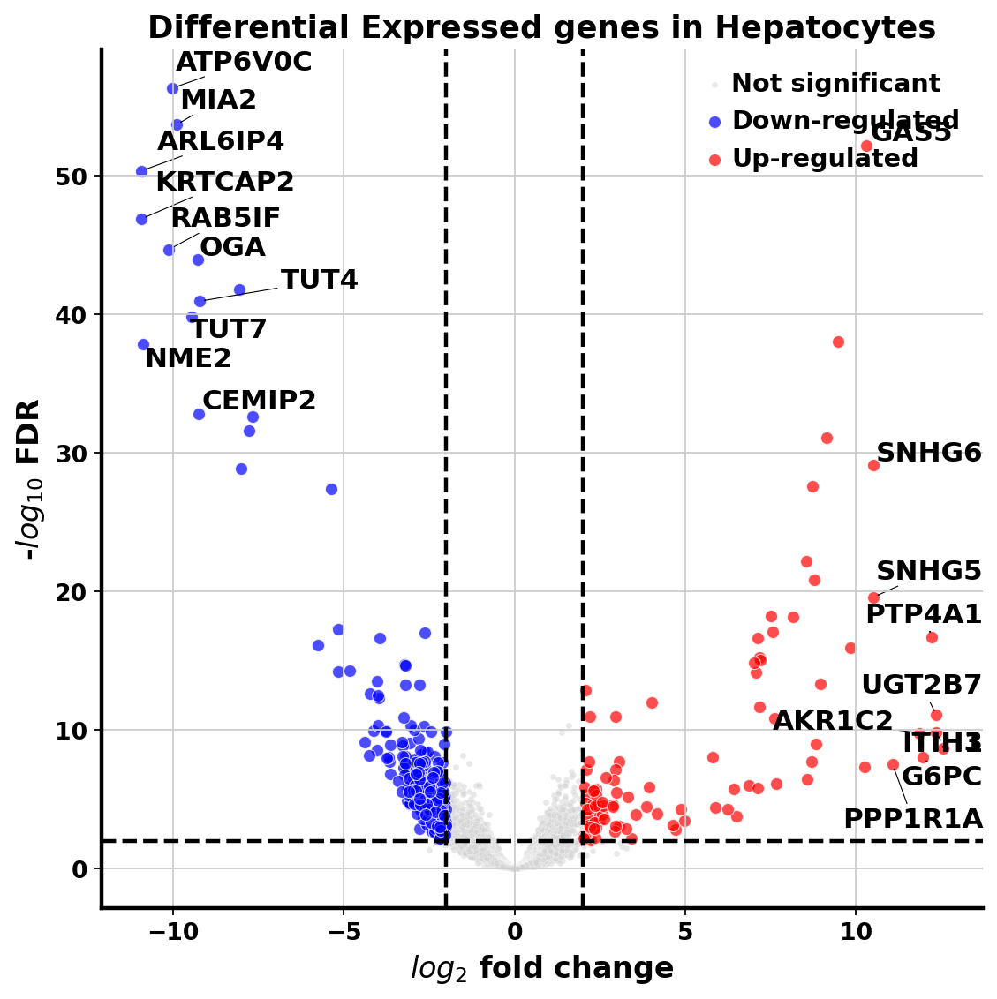

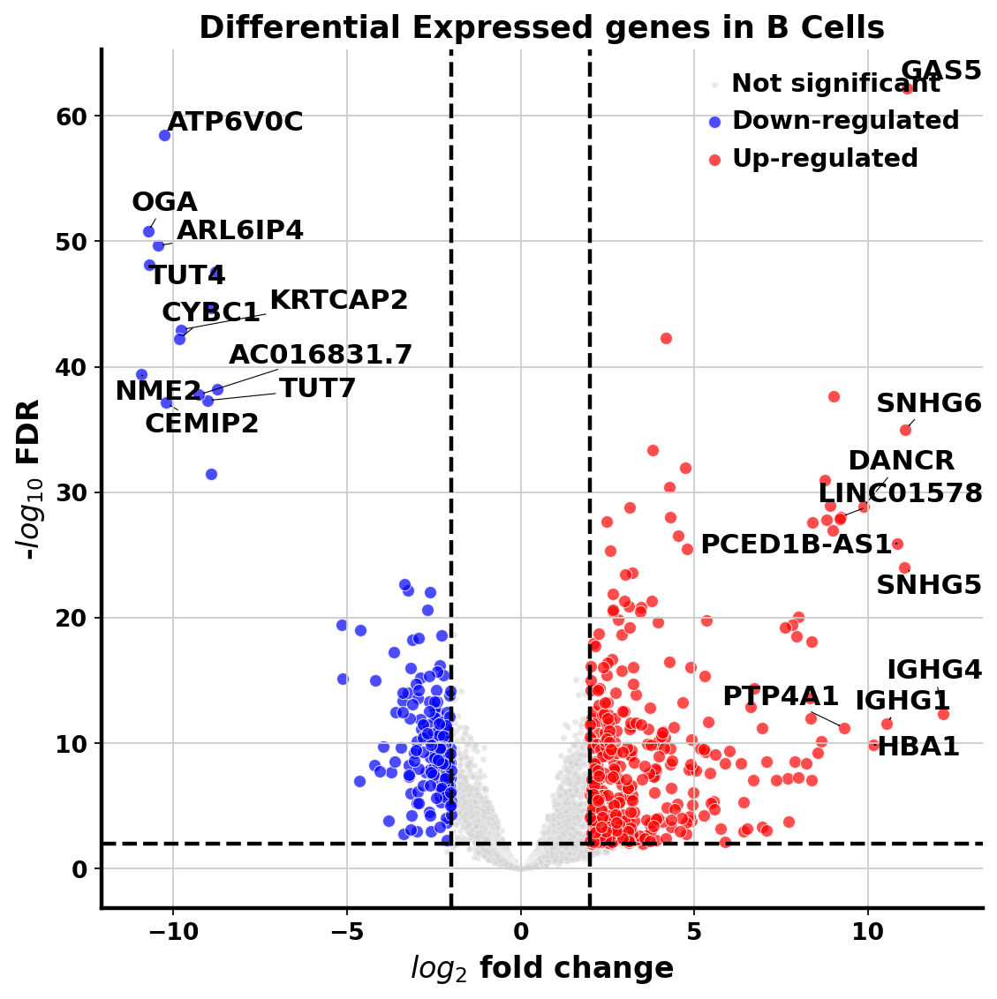

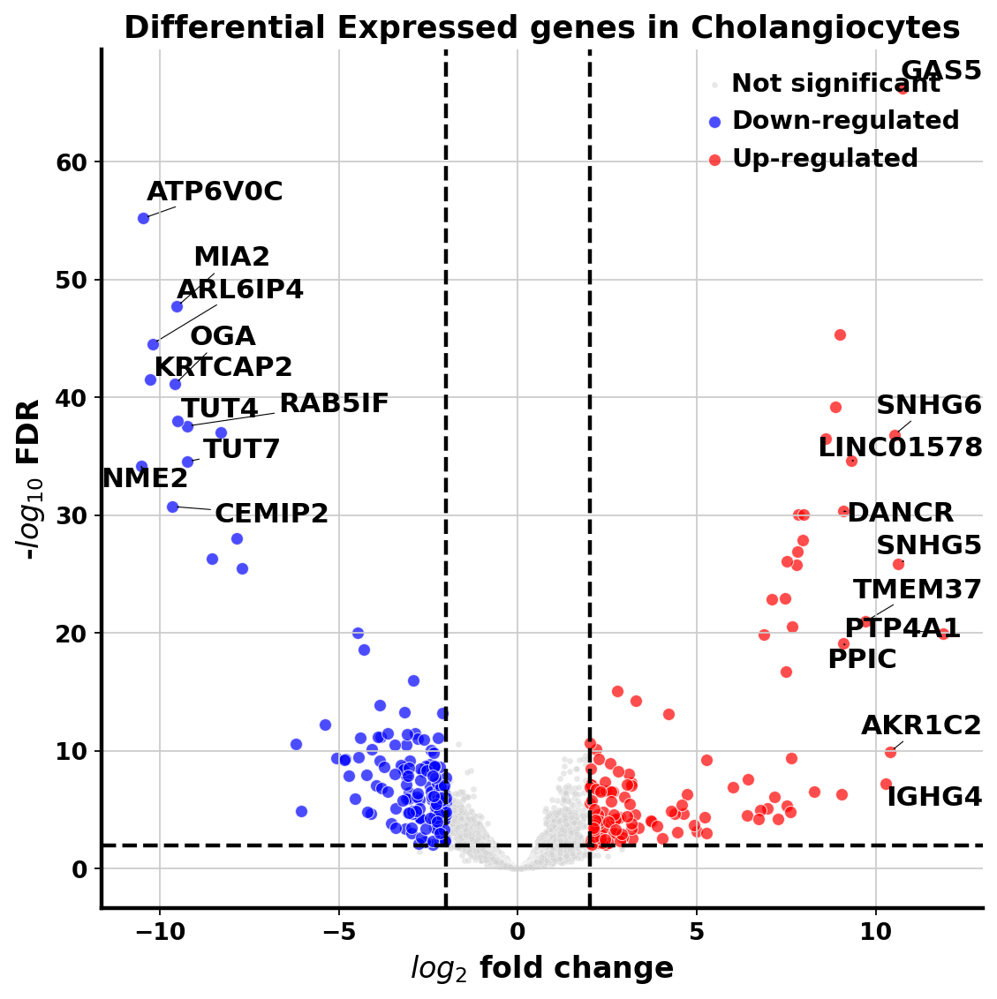

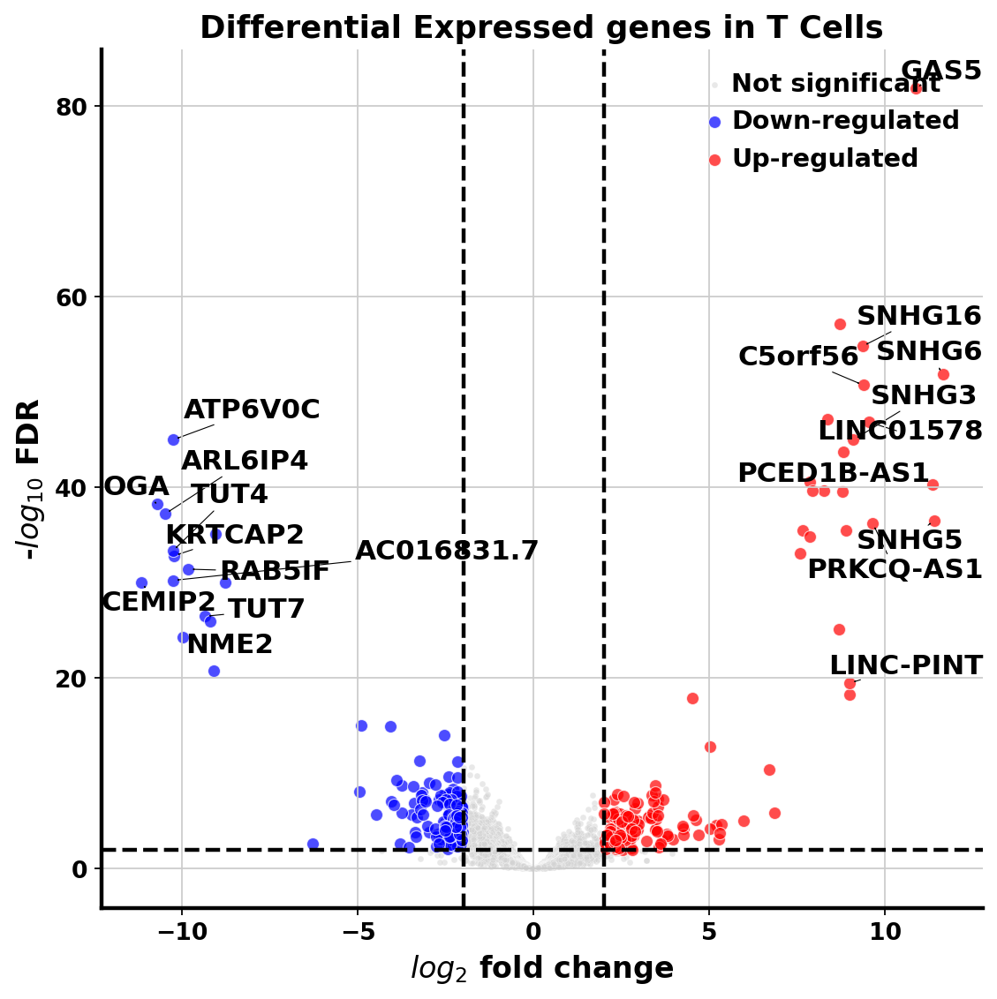

In [105]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from adjustText import adjust_text
import pandas as pd

# Definir umbrales para log-fold change y p-valor ajustado
LOG_FOLD_CHANGE_THRESHOLD = 2
PVAL_ADJ_THRESHOLD = 0.01

def enhanced_volcano_plot(adata, group_key, title=None):
    # Extraer el nombre del tipo celular
    cell_type = "_".join(group_key.split("_")[1:])
    
    # Obtener los resultados del contraste para el tipo celular usando el objeto filtrado
    result = sc.get.rank_genes_groups_df(adata, group=cell_type, key=group_key).copy()
    
    # Asegurarnos de que 'logfoldchanges' es numérico
    result['logfoldchanges'] = pd.to_numeric(result['logfoldchanges'], errors='coerce')
    result['-log10(FDR)'] = -np.log10(result['pvals_adj'].astype(float).fillna(1))
    
    # Filtrar para obtener genes up-regulated, down-regulated y no significativos
    upregulated_genes = result[(result["logfoldchanges"] >= LOG_FOLD_CHANGE_THRESHOLD) & (result["pvals_adj"] <= PVAL_ADJ_THRESHOLD)]
    downregulated_genes = result[(result["logfoldchanges"] <= -LOG_FOLD_CHANGE_THRESHOLD) & (result["pvals_adj"] <= PVAL_ADJ_THRESHOLD)]
    non_significant_genes = result[~((abs(result["logfoldchanges"]) >= LOG_FOLD_CHANGE_THRESHOLD) & (result["pvals_adj"] <= PVAL_ADJ_THRESHOLD))]
    
    # Seleccionar top 10 de up-regulated y down-regulated para etiquetas
    top_10_up = upregulated_genes.nlargest(10, 'logfoldchanges')
    top_10_down = downregulated_genes.nsmallest(10, 'logfoldchanges')
    
    # Crear el volcano plot con el estilo especificado
    plt.figure(figsize=(8, 8))
    ax = sns.scatterplot(
        x=non_significant_genes["logfoldchanges"],
        y=non_significant_genes["-log10(FDR)"],
        color="lightgrey",
        s=10,
        label="Not significant",
        alpha=0.5
    )
    sns.scatterplot(
        x=downregulated_genes["logfoldchanges"],
        y=downregulated_genes["-log10(FDR)"],
        color="blue",
        s=40,
        label="Down-regulated",
        alpha=0.7
    )
    sns.scatterplot(
        x=upregulated_genes["logfoldchanges"],
        y=upregulated_genes["-log10(FDR)"],
        color="red",
        s=40,
        label="Up-regulated",
        alpha=0.7
    )
    
    # Agregar etiquetas para los top 10 up y down-regulated en negritas
    texts = []
    for _, row in top_10_up.iterrows():
        texts.append(plt.text(row["logfoldchanges"], row["-log10(FDR)"], row["names"], fontweight="bold"))
    for _, row in top_10_down.iterrows():
        texts.append(plt.text(row["logfoldchanges"], row["-log10(FDR)"], row["names"], fontweight="bold"))
    adjust_text(texts, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
    
    # Añadir líneas de referencia
    plt.axhline(-np.log10(PVAL_ADJ_THRESHOLD), color="black", linestyle="--", lw=2)
    plt.axvline(LOG_FOLD_CHANGE_THRESHOLD, color="black", linestyle="--", lw=2)
    plt.axvline(-LOG_FOLD_CHANGE_THRESHOLD, color="black", linestyle="--", lw=2)
    
    # Personalizar ejes y título
    plt.xlabel(r"$log_{2}$ fold change", size=15, weight="bold")
    plt.ylabel(r"-$log_{10}$ FDR", size=15, weight="bold")
    if title is None:
        title = f"Volcano plot for {cell_type}"
    plt.title(title, size=16, weight="bold")
    
    # Ajuste de bordes y leyenda
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    plt.xticks(size=12, weight="bold")
    plt.yticks(size=12, weight="bold")
    plt.legend(loc="upper right", frameon=False, prop={"weight": "bold"})
    plt.savefig(f"{title}.png", dpi=300, bbox_inches="tight")

    plt.show()

# Llamar a la función para cada tipo celular usando sus claves en adata.uns
enhanced_volcano_plot(adata, "edgeR_Hepatocytes", title="Differential Expressed genes in Hepatocytes")
enhanced_volcano_plot(adata, "edgeR_B_cells", title="Differential Expressed genes in B Cells")
enhanced_volcano_plot(adata, "edgeR_Cholangiocytes", title="Differential Expressed genes in Cholangiocytes")
enhanced_volcano_plot(adata, "edgeR_T_cells", title="Differential Expressed genes in T Cells")


Plotting 636 genes...


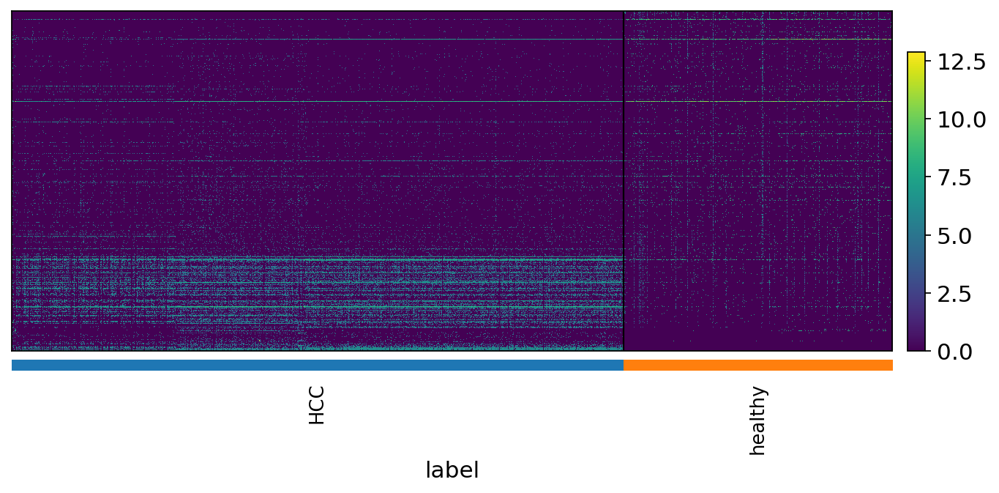

Plotting 568 genes...


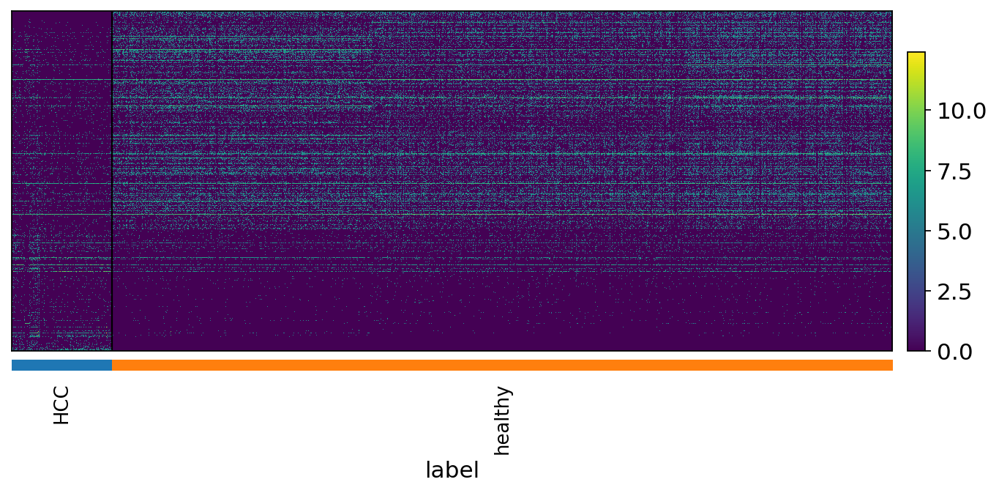

Plotting 554 genes...


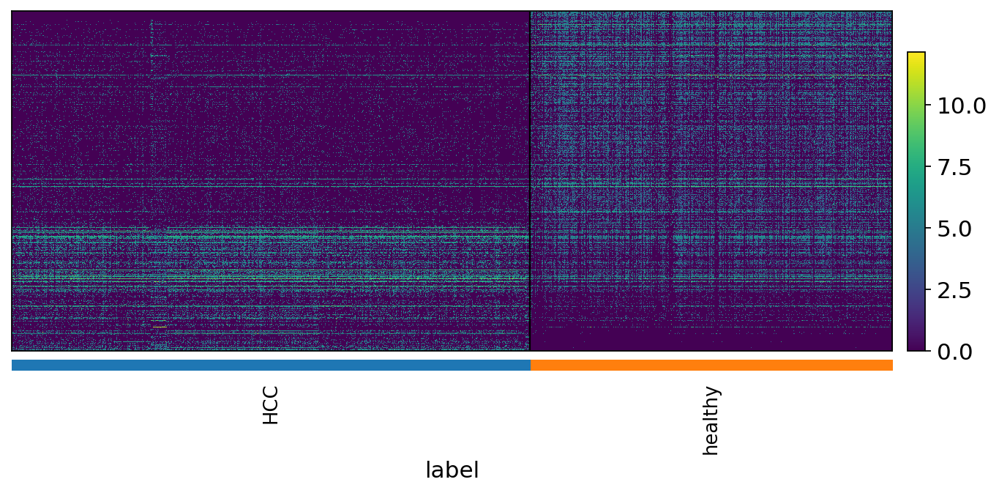

Plotting 1115 genes...


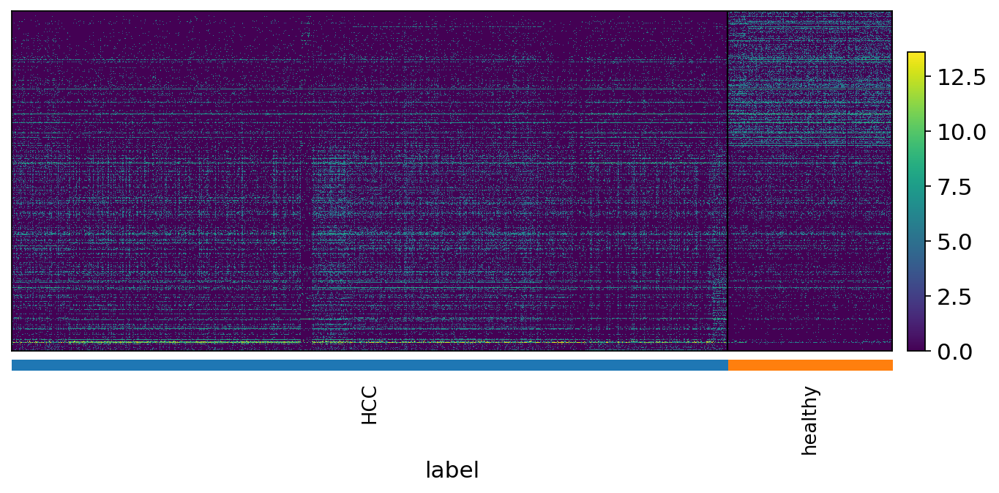

In [77]:
import os 
FDR = 0.01
LOG_FOLD_CHANGE = 1.5

# Configurar Scanpy para guardar figuras en alta resolución y en el directorio deseado
output_dir = "/home/mdiaz/sc_liver_data/imagenes_plots"
os.makedirs(output_dir, exist_ok=True)  # Crear la carpeta si no existe
sc.settings.figdir = output_dir
sc.settings.set_figure_params(dpi_save=300)  # dpi=300 para alta resolución

def plot_heatmap(adata, group_key, group_name="cell_type", groupby="label"):
    cell_type = "_".join(group_key.split("_")[1:])
    res = sc.get.rank_genes_groups_df(adata, group=cell_type, key=group_key)
    res.index = res["names"].values
    res = res[
        (res["pvals_adj"] < FDR) & (abs(res["logfoldchanges"]) > LOG_FOLD_CHANGE)
    ].sort_values(by=["logfoldchanges"])
    print(f"Plotting {len(res)} genes...")
    markers = list(res.index)
    
    # Guardar el heatmap en el directorio especificado
    sc.pl.heatmap(
        adata[adata.obs[group_name] == cell_type].copy(),
        markers,
        groupby=groupby,
        swap_axes=True,
        save=f"{group_key}_heatmap.png"  # Se guardará en el directorio definido en sc.settings.figdir
    )

# Generar y guardar los heatmaps
plot_heatmap(adata, "edgeR_Hepatocytes")
plot_heatmap(adata, "edgeR_T_cells")
plot_heatmap(adata, "edgeR_Cholangiocytes")
plot_heatmap(adata, "edgeR_B_cells")



Plotting 20 genes for Hepatocytes...


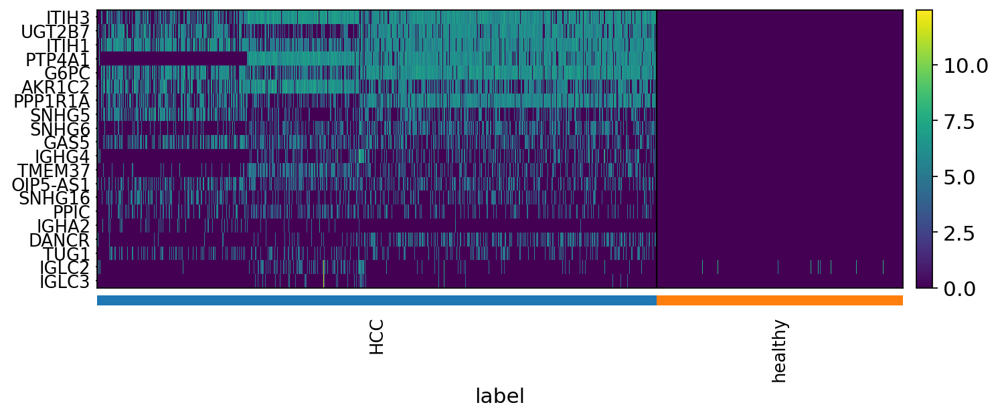

Plotting 20 genes for B_cells...


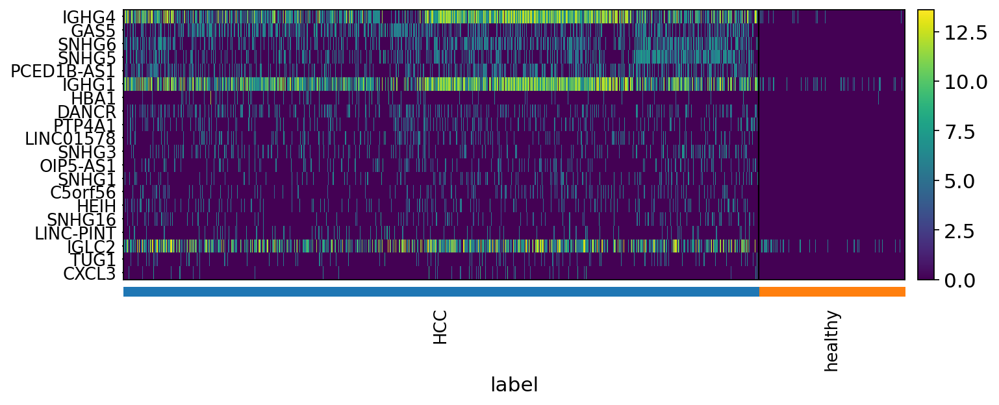

Plotting 20 genes for Cholangiocytes...


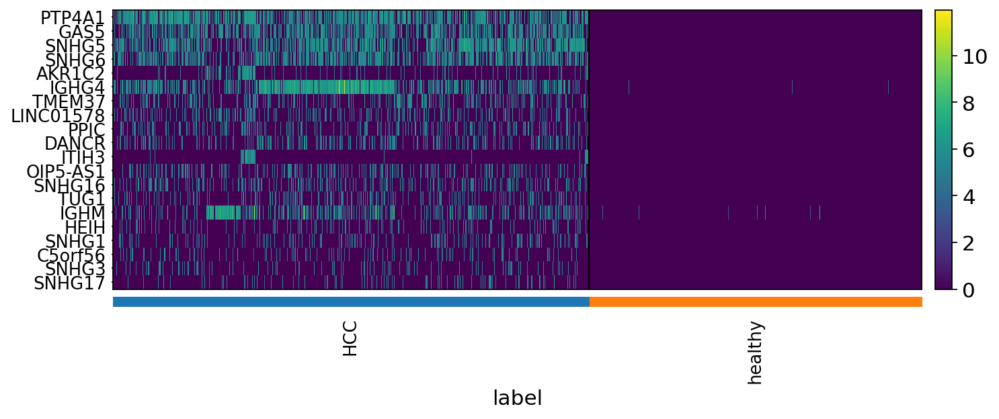

Plotting 20 genes for T_cells...


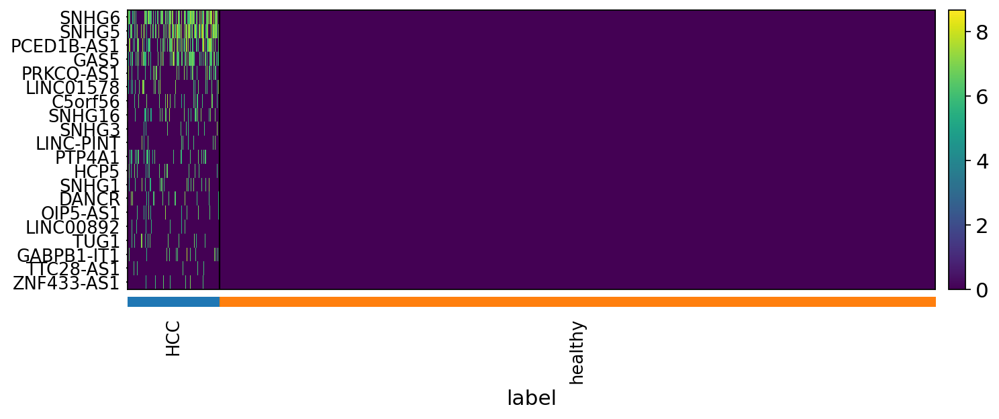

In [78]:
# Parámetros para filtrado de genes diferencialmente expresados
FDR_THRESHOLD = 0.01
LOG_FOLD_CHANGE_THRESHOLD = 1.5

def plot_heatmap_pilot(adata, group_key, group_name="cell_type", groupby="label"):
    # Obtener el tipo de célula específico del grupo
    pilot_cell_type = "_".join(group_key.split("_")[1:])
    
    # Obtener el DataFrame de genes diferencialmente expresados
    pilot_res = sc.get.rank_genes_groups_df(adata, group=pilot_cell_type, key=group_key)
    
    # Filtrar los genes según los criterios de FDR y log-fold change
    pilot_res = pilot_res[
        (pilot_res["pvals_adj"] < FDR_THRESHOLD) & 
        (abs(pilot_res["logfoldchanges"]) > LOG_FOLD_CHANGE_THRESHOLD)
    ]
    
    # Ordenar por log-fold change y seleccionar los top 20 genes
    pilot_res = pilot_res.sort_values(by=["logfoldchanges"], ascending=False).head(20)
    
    # Usar los nombres de los genes seleccionados como índice
    pilot_res.index = pilot_res["names"].values
    
    print(f"Plotting {len(pilot_res)} genes for {pilot_cell_type}...")
    
    # Crear el heatmap usando los nombres de los genes seleccionados
    pilot_markers = list(pilot_res.index)  # Lista con los nombres de los genes seleccionados
    sc.pl.heatmap(
        adata[adata.obs[group_name] == pilot_cell_type].copy(),
        pilot_markers,
        groupby=groupby,
        swap_axes=True,
    )

# Ejemplo de cómo llamar a la función para diferentes tipos celulares sin sobreescribir variables
plot_heatmap_pilot(adata, "edgeR_Hepatocytes")
plot_heatmap_pilot(adata, "edgeR_B_cells")
plot_heatmap_pilot(adata, "edgeR_Cholangiocytes")
plot_heatmap_pilot(adata, "edgeR_T_cells")


Plotting 20 genes for Hepatocytes...


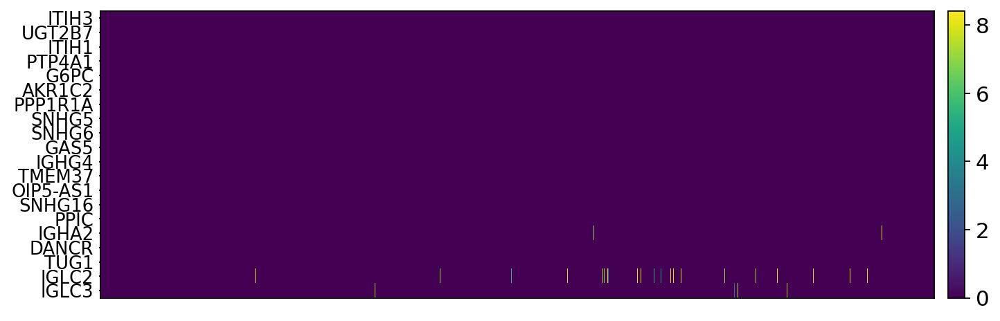

Plotting 20 genes for B_cells...


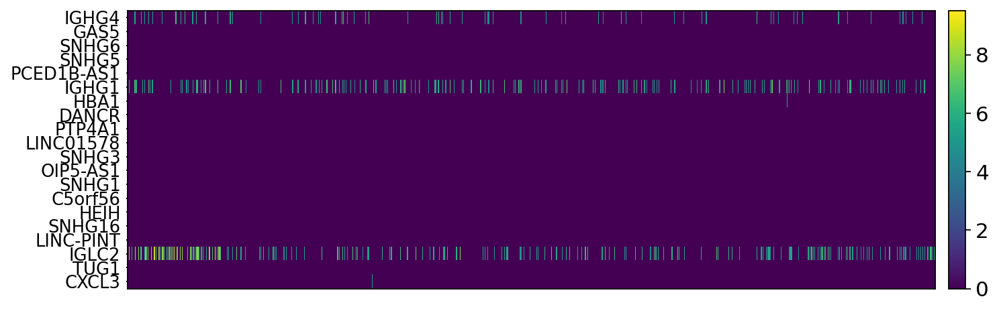

Plotting 20 genes for Cholangiocytes...


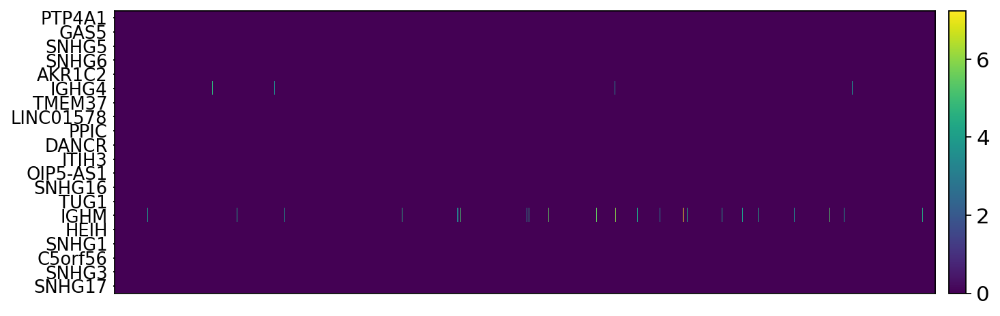

Plotting 20 genes for T_cells...


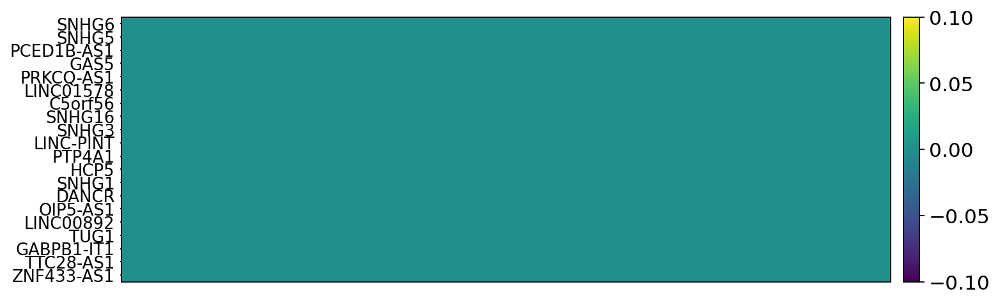

In [79]:
# Parámetros para filtrado de genes diferencialmente expresados
FDR_THRESHOLD = 0.01
LOG_FOLD_CHANGE_THRESHOLD = 1.5

def plot_heatmap_pilot(adata, group_key, group_name="cell_type", groupby="label"):
    # Obtener el tipo de célula específico del grupo
    pilot_cell_type = "_".join(group_key.split("_")[1:])
    
    # Obtener el DataFrame de genes diferencialmente expresados
    pilot_res = sc.get.rank_genes_groups_df(adata, group=pilot_cell_type, key=group_key)
    
    # Filtrar los genes según los criterios de FDR y log-fold change
    pilot_res = pilot_res[
        (pilot_res["pvals_adj"] < FDR_THRESHOLD) & 
        (abs(pilot_res["logfoldchanges"]) > LOG_FOLD_CHANGE_THRESHOLD)
    ]
    
    # Ordenar por log-fold change y seleccionar los top 20 genes
    pilot_res = pilot_res.sort_values(by=["logfoldchanges"], ascending=False).head(20)
    
    # Usar los nombres de los genes seleccionados como índice
    pilot_res.index = pilot_res["names"].values
    
    print(f"Plotting {len(pilot_res)} genes for {pilot_cell_type}...")

    # Filtrar solo las células etiquetadas como 'tumor_tissue' y 'healthy' en el adata.obs["label"]
    adata_filtered = adata[(adata.obs["label"].isin(["tumor_tissue", "healthy"])) & 
                           (adata.obs[group_name] == pilot_cell_type)].copy()
    
    # Crear el heatmap usando los nombres de los genes seleccionados
    pilot_markers = list(pilot_res.index)  # Lista con los nombres de los genes seleccionados
    sc.pl.heatmap(
        adata_filtered,
        pilot_markers,
        groupby=groupby,
        swap_axes=True,
    )

# Ejemplo de cómo llamar a la función para diferentes tipos celulares sin sobreescribir variables
plot_heatmap_pilot(adata, "edgeR_Hepatocytes")
plot_heatmap_pilot(adata, "edgeR_B_cells")
plot_heatmap_pilot(adata, "edgeR_Cholangiocytes")
plot_heatmap_pilot(adata, "edgeR_T_cells")


# Gene set enrichment

In [80]:
# Setting up R dependencies
import anndata2ri
import rpy2
from rpy2.robjects import r
import random
%load_ext rpy2.ipython
anndata2ri.activate()

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [81]:
from __future__ import annotations
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import decoupler
import seaborn.objects as so
import session_info

In [82]:
# Filtering warnings from current version of matplotlib
import warnings
warnings.filterwarnings(
    "ignore", message=".*Parameters 'cmap' will be ignored.*", category=UserWarning
)
warnings.filterwarnings(
    "ignore", message="Tight layout not applied.*", category=UserWarning
)

In [83]:
%%R
suppressPackageStartupMessages({
    library(SingleCellExperiment)
})

In [84]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))

In [85]:
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'label', 'sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'cell_type', 'dataset', 'leiden'
    var: 'n_cells'
    uns: 'DX_colors', 'leiden', 'neighbors', 'pca', 'scVI_Model_Predictions_colors', 'umap', 'edgeR_B_cells', 'edgeR_Cholangiocytes', 'edgeR_Hepatocytes', 'edgeR_T_cells', 'log1p'
    obsm: 'X_pca', 'X_pca_harmony', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [86]:
# Storing the counts for later use
adata.layers["counts"] = adata.X.copy()
# Renaming label to condition
adata.obs = adata.obs.rename({"label": "condition"}, axis=1)
# Normalizing
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [87]:
# Finding highly variable genes using count data
sc.pp.highly_variable_genes(
    adata, n_top_genes=4000, flavor="seurat_v3", subset=False, layer="counts"
)
adata

AnnData object with n_obs × n_vars = 95164 × 15404
    obs: 'Patient', 'condition', 'sample', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'doublet', 'Batch', 'predicted', 'transfer_score', 'overcluster', 'cell_type', 'dataset', 'leiden'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'DX_colors', 'leiden', 'neighbors', 'pca', 'scVI_Model_Predictions_colors', 'umap', 'edgeR_B_cells', 'edgeR_Cholangiocytes', 'edgeR_Hepatocytes', 'edgeR_T_cells', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [88]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [126]:
import scanpy as sc
import matplotlib.pyplot as plt

# Calcular UMAP si no lo has hecho ya
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# Crear el gráfico UMAP
fig, ax = plt.subplots(figsize=(8, 6))  # Crear un gráfico con un tamaño adecuado

# Graficar UMAP con las variables 'condition' y 'cell_type'
sc.pl.umap(
    adata,
    color=["condition"],
    frameon=False,
    ncols=1,
    ax=ax,  # Pasar el eje actual al gráfico
    show=False  # Evitar que se muestre automáticamente
)

# Añadir etiquetas a los ejes
ax.set_xlabel('UMAP1')  # Etiqueta del eje X
ax.set_ylabel('UMAP2')  # Etiqueta del eje Y

# Mostrar el gráfico
plt.tight_layout()  # Ajustar el diseño para evitar que se corten las etiquetas
plt.savefig('/home/mdiaz/sc_liver_data/figures/umap_high_res.png', dpi=300, bbox_inches='tight')
plt.close()  # Cerrar la figura para liberar memoria


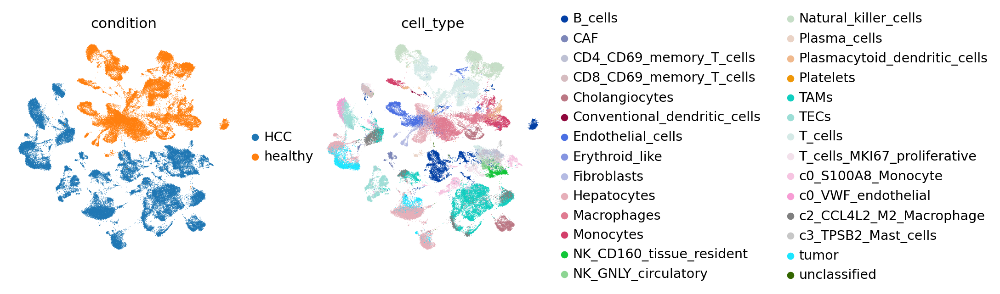

In [133]:
sc.pl.umap(
    adata,
    color=["condition", "cell_type"],
    frameon=False,
    ncols=2,
)

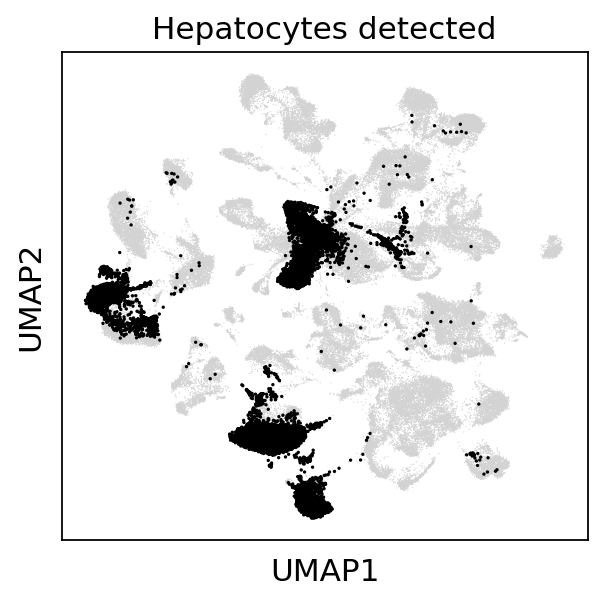

In [141]:
import scanpy as sc
import matplotlib.pyplot as plt

# Crear el UMAP inicial
ax = sc.pl.umap(adata, palette='lightgrey', show=False)

# Graficar las células de 'Hepatocytes' con el color de 'overcluster'
sc.pl.umap(
    adata[adata.obs.cell_type == 'Hepatocytes'],
    color='overcluster',
    ax=ax,
    legend_loc=None,
    palette='k',
    title='Hepatocytes detected',
    show=False  # No mostrar el gráfico aún
)

# Guardar el gráfico en alta resolución en el directorio deseado
plt.tight_layout()  # Ajustar el diseño para que no se corten las etiquetas
plt.savefig('/home/mdiaz/sc_liver_data/figures/umap_hepatocytes.png', dpi=300, bbox_inches='tight')
  # Cerrar la figura para liberar memoria


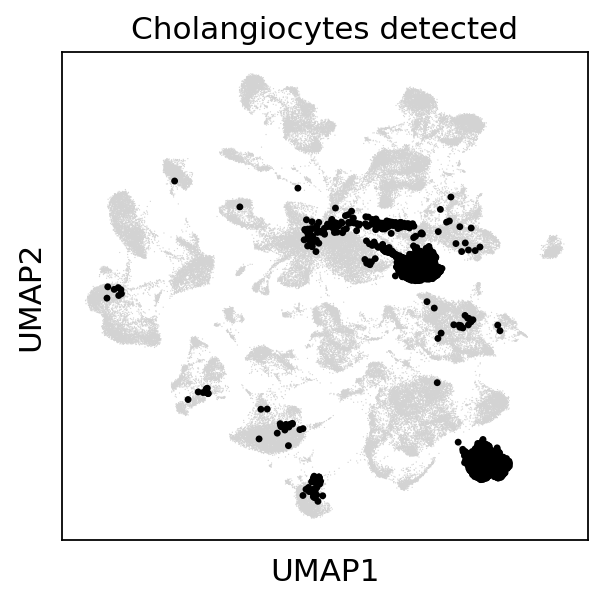

In [142]:
import scanpy as sc
import matplotlib.pyplot as plt

# Crear el UMAP inicial
ax = sc.pl.umap(adata, palette='lightgrey', show=False)

# Graficar las células de 'Cholangiocytes' con el color de 'overcluster'
sc.pl.umap(
    adata[adata.obs.cell_type == 'Cholangiocytes'],
    color='overcluster',
    ax=ax,
    legend_loc=None,
    palette='k',
    title='Cholangiocytes detected',
    show=False  # No mostrar el gráfico aún
)

# Guardar el gráfico en alta resolución en el directorio deseado
plt.tight_layout()  # Ajustar el diseño para que no se corten las etiquetas
plt.savefig('/home/mdiaz/sc_liver_data/figures/umap_cholangiocytes.png', dpi=300, bbox_inches='tight')
 # Cerrar la figura para liberar memoria


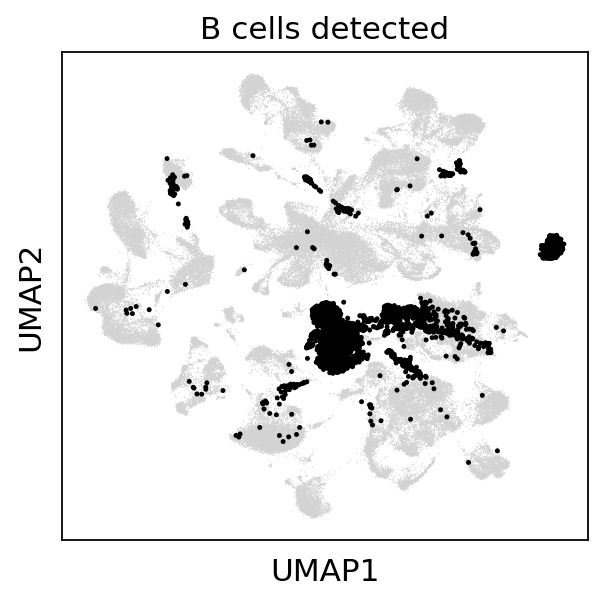

In [143]:
import scanpy as sc
import matplotlib.pyplot as plt

# Crear el UMAP inicial
ax = sc.pl.umap(adata, palette='lightgrey', show=False)

# Graficar las células de 'B_cells' con el color de 'overcluster'
sc.pl.umap(
    adata[adata.obs.cell_type == 'B_cells'],
    color='overcluster',
    ax=ax,
    legend_loc=None,
    palette='k',
    title='B cells detected',
    show=False  # No mostrar el gráfico aún
)

# Guardar el gráfico en alta resolución en el directorio deseado
plt.tight_layout()  # Ajustar el diseño para que no se corten las etiquetas
plt.savefig('/home/mdiaz/sc_liver_data/figures/umap_b_cells.png', dpi=300, bbox_inches='tight')


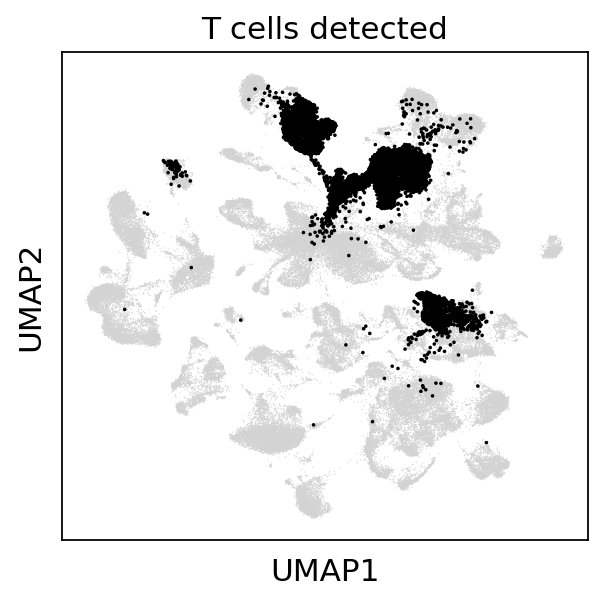

In [144]:
import scanpy as sc
import matplotlib.pyplot as plt

# Crear el UMAP inicial
ax = sc.pl.umap(adata, palette='lightgrey', show=False)

# Graficar las células de 'T_cells' con el color de 'overcluster'
sc.pl.umap(
    adata[adata.obs.cell_type == 'T_cells'],
    color='overcluster',
    ax=ax,
    legend_loc=None,
    palette='k',
    title='T cells detected',
    show=False  # No mostrar el gráfico aún
)

# Guardar el gráfico en alta resolución en el directorio deseado
plt.tight_layout()  # Ajustar el diseño para que no se corten las etiquetas
plt.savefig('/home/mdiaz/sc_liver_data/figures/umap_t_cells.png', dpi=300, bbox_inches='tight')
  # Cerrar la figura para liberar memoria


We run a wilcoxon test using rank_genes_groups in `scanpy` to rank genes according to their test statistics for differential expression.

In [102]:
adata.obs["group"] = adata.obs.condition.astype("string") + "_" + adata.obs.cell_type

In [103]:
sc.tl.rank_genes_groups(adata, "group", method="wilcoxon", key_added="wilcoxon")


In [104]:
adata.obs['group'].unique()

['HCC_B_cells', 'HCC_CD4_CD69_memory_T_cells', 'HCC_TAMs', 'HCC_Cholangiocytes', 'HCC_c3_TPSB2_Mast_cells', ..., 'healthy_Endothelial_cells', 'healthy_Macrophages', 'healthy_Cholangiocytes', 'healthy_Platelets', 'healthy_Erythroid_like']
Length: 32
Categories (32, string): [HCC_B_cells, HCC_CAF, HCC_CD4_CD69_memory_T_cells, HCC_CD8_CD69_memory_T_cells, ..., healthy_Plasma_cells, healthy_Plasmacytoid_dendritic_cells, healthy_Platelets, healthy_T_cells]

In [106]:
hepatocyte_condition = 'HCC_Hepatocytes'

In [107]:
# extract scores
hep_w_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, hepatocyte_condition, key="wilcoxon")
    # Subset to highly variable genes
    .set_index("names")
    .loc[adata.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis(["tumor_tissue_Hepatocytes"], axis=1)
)
hep_w_stats

tumor_tissue_Hepatocytes,scores
names,
GSTA1,133.862381
HMGCS2,133.618256
KNG1,133.275787
HSD17B6,130.592117
ORM2,129.649490
...,...
ARIH2OS,-0.015273
CCNB1,0.003533
AC132872.1,0.002093


In [108]:
# extract scores
hep_w_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, hepatocyte_condition, key="wilcoxon")
    # Subset to highly variable genes
    .set_index("names")
    .loc[adata.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis(["tumor_tissue_Hepatocytes"], axis=1)
)
hep_w_stats

tumor_tissue_Hepatocytes,scores
names,
GSTA1,133.862381
HMGCS2,133.618256
KNG1,133.275787
HSD17B6,130.592117
ORM2,129.649490
...,...
ARIH2OS,-0.015273
CCNB1,0.003533
AC132872.1,0.002093


In [109]:
bcell_condition = 'HCC_B_cells'

In [110]:
bcell_w_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, bcell_condition, key="wilcoxon")
    # Subset to highly variable genes
    .set_index("names")
    .loc[adata.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis(["tumor_tissue_B_cells"], axis=1)
)
bcell_w_stats

tumor_tissue_B_cells,scores
names,
IGKC,105.824501
MZB1,90.950272
IGHG1,83.330635
IGHM,82.145599
JCHAIN,79.421066
...,...
AC022182.2,0.006427
STAM-AS1,0.005345
PRICKLE1,-0.004231


In [111]:
chol_condition = 'HCC_Cholangiocytes'

In [112]:
chol_w_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, chol_condition, key="wilcoxon")
    # Subset to highly variable genes
    .set_index("names")
    .loc[adata.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis(["tumor_tissue_Cholangiocytes"], axis=1)
)
chol_w_stats

tumor_tissue_Cholangiocytes,scores
names,
ANXA4,66.516510
TM4SF4,63.815392
CD24,63.628662
DEFB1,63.550121
KRT8,63.438839
...,...
SYNPO2,-0.003620
HSPA1A,0.003148
LRRC69,0.002047


In [113]:
tcell_condition = 'HCC_T_cells'

In [114]:
tcell_w_stats = (
    # Get dataframe of DE results for condition vs. rest
    sc.get.rank_genes_groups_df(adata, tcell_condition, key="wilcoxon")
    # Subset to highly variable genes
    .set_index("names")
    .loc[adata.var["highly_variable"]]
    # Sort by absolute score
    .sort_values("scores", key=np.abs, ascending=False)
    # Format for decoupler
    [["scores"]]
    .rename_axis(["tumor_tissue_T_cells"], axis=1)
)
tcell_w_stats

tumor_tissue_T_cells,scores
names,
TRBC2,45.790920
RPS29,45.112209
CD52,45.060329
RPL31,44.854324
RPS20,44.323151
...,...
AC007365.1,-0.009488
TBC1D3L,0.005220
AC009120.2,0.002068


# Cluster-level gene set enrichment analysis with `decoupler` using Reactome

In [115]:
# Downloading reactome pathways
from pathlib import Path

if not Path("c2.cp.reactome.v7.5.1.symbols.gmt").is_file():
    !wget -O 'c2.cp.reactome.v7.5.1.symbols.gmt' https://figshare.com/ndownloader/files/35233771

In [116]:
def gmt_to_decoupler(pth: Path) -> pd.DataFrame:
    """
    Parse a gmt file to a decoupler pathway dataframe.
    """
    from itertools import chain, repeat

    pathways = {}

    with Path(pth).open("r") as f:
        for line in f:
            name, _, *genes = line.strip().split("\t")
            pathways[name] = genes

    return pd.DataFrame.from_records(
        chain.from_iterable(zip(repeat(k), v) for k, v in pathways.items()),
        columns=["geneset", "genesymbol"],
    )

In [117]:
reactome = gmt_to_decoupler("c2.cp.reactome.v7.5.1.symbols.gmt")

In [118]:
# Retrieving via python
msigdb = decoupler.get_resource("MSigDB")

# Get reactome pathways
reactome = msigdb.query("collection == 'reactome_pathways'")
# Filter duplicates
reactome = reactome[~reactome.duplicated(("geneset", "genesymbol"))]

In [119]:
reactome

,genesymbol,collection,geneset
200,MAFF,reactome_pathways,REACTOME_HEMOSTASIS
342,MAFF,reactome_pathways,REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEV...
718,IER3,reactome_pathways,REACTOME_INTRACELLULAR_SIGNALING_BY_SECOND_MES...
859,IER3,reactome_pathways,REACTOME_NEGATIVE_REGULATION_OF_THE_PI3K_AKT_N...
1104,PHLDA1,reactome_pathways,REACTOME_MITOTIC_G2_G2_M_PHASES
...,...,...,...
3838483,KIR2DS2,reactome_pathways,REACTOME_DAP12_INTERACTIONS
3838489,KIR2DS2,reactome_pathways,REACTOME_INNATE_IMMUNE_SYSTEM
3838499,KIR2DS2,reactome_pathways,REACTOME_ADAPTIVE_IMMUNE_SYSTEM
3838530,KIR3DS1,reactome_pathways,REACTOME_DAP12_INTERACTIONS


# GSEA enrichment

First we’ll prepare our gene sets. By default decoupler will not filter gene sets by maximum size, which packages like gsea do. Instead we will simply manually filter gene sets to have a minimum of 15 genes and a maximum of 500 genes.

In [121]:
# Filtering genesets to match behaviour of fgsea
geneset_size = reactome.groupby("geneset").size()
gsea_genesets = geneset_size.index[(geneset_size > 15) & (geneset_size < 500)]

## Hepatocytes score

In [122]:
scores, norm, pvals = decoupler.run_gsea(
    hep_w_stats.T,
    reactome[reactome["geneset"].isin(gsea_genesets)],
    source="geneset",
    target="genesymbol",
)

hep_gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

In [123]:
hep_gsea_results.head(10)

,score,norm,pval
source,,,
REACTOME_NONSENSE_MEDIATED_DECAY_NMD,-0.700429,-1.834516,0.0
REACTOME_THE_CITRIC_ACID_TCA_CYCLE_AND_RESPIRATORY_ELECTRON_TRANSPORT,0.837664,1.695775,0.0
REACTOME_INTERFERON_SIGNALING,-0.648508,-1.829949,0.0
REACTOME_REGULATION_OF_LIPID_METABOLISM_BY_PPARALPHA,0.821429,1.657607,0.0
REACTOME_TRANSLATION,-0.679401,-1.826334,0.0
REACTOME_SARS_COV_2_HOST_INTERACTIONS,-0.660652,-1.705524,0.0
REACTOME_RHO_GTPASE_CYCLE,-0.512410,-1.543109,0.0
REACTOME_RHO_GTPASE_EFFECTORS,-0.660543,-1.852126,0.0
REACTOME_BILE_ACID_AND_BILE_SALT_METABOLISM,0.953533,1.788917,0.0


# B cells score

In [124]:
scores, norm, pvals = decoupler.run_gsea(
    bcell_w_stats.T,
    reactome[reactome["geneset"].isin(gsea_genesets)],
    source="geneset",
    target="genesymbol",
)

bcell_gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

In [125]:
bcell_gsea_results.head(10)

,score,norm,pval
source,,,
REACTOME_SARS_COV_2_INFECTION,0.739855,2.108400,0.0
REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN_TARGETING_TO_MEMBRANE,0.909645,2.484227,0.0
REACTOME_SYNTHESIS_OF_BILE_ACIDS_AND_BILE_SALTS,-0.818706,-1.588728,0.0
REACTOME_REGULATION_OF_EXPRESSION_OF_SLITS_AND_ROBOS,0.886003,2.489077,0.0
REACTOME_FORMATION_OF_FIBRIN_CLOT_CLOTTING_CASCADE,-0.740222,-1.647440,0.0
REACTOME_REGULATION_OF_INSULIN_LIKE_GROWTH_FACTOR_IGF_TRANSPORT_AND_UPTAKE_BY_INSULIN_LIKE_GROWTH_FACTOR_BINDING_PROTEINS_IGFBPS,-0.620270,-1.655338,0.0
REACTOME_REGULATION_OF_LIPID_METABOLISM_BY_PPARALPHA,-0.761920,-1.701098,0.0
REACTOME_CD22_MEDIATED_BCR_REGULATION,0.912328,1.915066,0.0
REACTOME_METABOLISM_OF_AMINO_ACIDS_AND_DERIVATIVES,0.754756,2.301844,0.0


# Cholangiocytes score 

In [126]:
scores, norm, pvals = decoupler.run_gsea(
    chol_w_stats.T,
    reactome[reactome["geneset"].isin(gsea_genesets)],
    source="geneset",
    target="genesymbol",
)

chol_gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

In [127]:
chol_gsea_results.head(10)

,score,norm,pval
source,,,
REACTOME_FORMATION_OF_THE_CORNIFIED_ENVELOPE,0.950960,1.891308,0.0
REACTOME_CELL_CELL_JUNCTION_ORGANIZATION,0.862457,1.656976,0.0
REACTOME_IMMUNOREGULATORY_INTERACTIONS_BETWEEN_A_LYMPHOID_AND_A_NON_LYMPHOID_CELL,-0.546418,-1.746818,0.0
REACTOME_GENERATION_OF_SECOND_MESSENGER_MOLECULES,-0.723781,-1.770047,0.0
REACTOME_INTERFERON_SIGNALING,-0.583298,-1.740191,0.0
REACTOME_COSTIMULATION_BY_THE_CD28_FAMILY,-0.704973,-1.846963,0.0
REACTOME_TCR_SIGNALING,-0.661493,-1.814270,0.0
REACTOME_PLASMA_LIPOPROTEIN_ASSEMBLY,-0.936990,-1.848747,0.0
REACTOME_KERATINIZATION,0.950960,1.891308,0.0


# T cells score

In [128]:
scores, norm, pvals = decoupler.run_gsea(
    tcell_w_stats.T,
    reactome[reactome["geneset"].isin(gsea_genesets)],
    source="geneset",
    target="genesymbol",
)

tcell_gsea_results = (
    pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis=1)
    .droplevel(level=1, axis=1)
    .sort_values("pval")
)

In [129]:
tcell_gsea_results.head(10)

,score,norm,pval
source,,,
REACTOME_TRANSLATION,0.921305,2.298970,0.0
REACTOME_CELLULAR_RESPONSE_TO_STARVATION,0.914517,2.294175,0.0
REACTOME_SELENOAMINO_ACID_METABOLISM,0.946145,2.333607,0.0
REACTOME_PLASMA_LIPOPROTEIN_REMODELING,-0.787592,-1.642964,0.0
REACTOME_SARS_COV_2_MODULATES_HOST_TRANSLATION_MACHINERY,0.954483,1.924131,0.0
REACTOME_SARS_COV_2_INFECTION,0.827552,2.099222,0.0
REACTOME_SARS_COV_2_HOST_INTERACTIONS,0.880745,2.149186,0.0
REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN_TARGETING_TO_MEMBRANE,0.938449,2.303233,0.0
REACTOME_PLASMA_LIPOPROTEIN_ASSEMBLY,-0.926361,-1.698779,0.0


In above, pval is the p-value for the enrichment test, while score and norm are enrichment scores and normalized enrichment scores respectively. Note that enrichment scores are signed. Therefore, a negative scores suggests the pathway is down-regulated and a positive score is indicative of up-regulation of genes in the pathway or gene set.

# Cluster-level gene set enrichment analysis with `GProfiler` 

## Exploring Reactome, Gene Ontology (GO), Kyoto Encyclopedia of Genes and Genomes (KEGG) annotations 

### Hepatocyte pathways

In [130]:
deg_hepatocytes = adata.uns['edgeR_Hepatocytes']['names']
print(deg_hepatocytes)

[('MALAT1',) ('MT-CO1',) ('IGKC',) ... ('TTC28-AS1',) ('TRIM52-AS1',)
 ('PRKCQ',)]


In [131]:
pvals_adj_numeric = adata.uns['edgeR_Hepatocytes']['pvals_adj']['Hepatocytes']
significant_genes = adata.uns['edgeR_Hepatocytes']['names'][pvals_adj_numeric < 0.05]

In [132]:
significant_genes

rec.array([('IGKC',), ('B2M',), ('MT-ND4',), ..., ('TTC28-AS1',),
           ('TRIM52-AS1',), ('PRKCQ',)],
          dtype=[('Hepatocytes', 'O')])

In [133]:
from gprofiler import GProfiler

# Paso 1: Acceder a los genes diferencialmente expresados y extraer valores numéricos de p-valor ajustado
deg_hepatocytes = adata.uns['edgeR_Hepatocytes']['names']
# Extrae los valores numéricos de p-valor ajustado del campo 'Hepatocytes'
pvals_adj_hepatocytes = adata.uns['edgeR_Hepatocytes']['pvals_adj']['Hepatocytes']

# Verifica que los valores sean numéricos; si no lo son, conviértelos
pvals_adj_hepatocytes = np.array(pvals_adj_hepatocytes, dtype=float)
significant_genes_hep = adata.uns['edgeR_Hepatocytes']['names'][pvals_adj_hepatocytes < 0.05]
significant_genes_hep = [gene[0] for gene in adata.uns['edgeR_Hepatocytes']['names'][pvals_adj_hepatocytes < 0.05]]
gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')
# Luego, realiza el análisis de enriquecimiento nuevamente
hepatocyte_enrichment = gp.profile(
    organism='hsapiens', 
    sources=['REAC'],  
    user_threshold=0.05,
    significance_threshold_method='fdr',
    background=adata.var_names.tolist(),  
    query=significant_genes_hep  # Ahora es una lista de cadenas
)

# Verifica los resultados
print(hepatocyte_enrichment)


    source              native  \
0     REAC   REAC:R-HSA-163200   
1     REAC  REAC:R-HSA-1428517   
2     REAC        REAC:0000000   
3     REAC   REAC:R-HSA-611105   
4     REAC   REAC:R-HSA-168256   
..     ...                 ...   
267   REAC  REAC:R-HSA-9006931   
268   REAC    REAC:R-HSA-69002   
269   REAC   REAC:R-HSA-195258   
270   REAC   REAC:R-HSA-389958   
271   REAC   REAC:R-HSA-400508   

                                                  name       p_value  \
0    Respiratory electron transport, ATP synthesis ...  2.027169e-22   
1    The citric acid (TCA) cycle and respiratory el...  2.094624e-22   
2                                   REACTOME root term  2.673815e-22   
3                       Respiratory electron transport  3.387657e-19   
4                                        Immune System  4.248362e-17   
..                                                 ...           ...   
267                     Signaling by Nuclear Receptors  4.477055e-02   
268            

In [134]:
hepatocyte_enrichment_results = hepatocyte_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]

In [135]:
pd.set_option("display.max_colwidth", 800)
hepatocyte_enrichment_results.iloc[:50,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-HSA-163200,2.027169e-22,124,67,0.540323,"Respiratory electron transport, ATP synthesis by chemiosmotic coupling, and heat production by uncoupling proteins."
REAC:R-HSA-1428517,2.094624e-22,169,80,0.473373,The citric acid (TCA) cycle and respiratory electron transport
REAC:0000000,2.673815e-22,8055,1346,0.167101,REACTOME root term
REAC:R-HSA-611105,3.387657e-19,103,56,0.543689,Respiratory electron transport
REAC:R-HSA-168256,4.248362e-17,1692,367,0.216903,Immune System
REAC:R-HSA-6799198,5.838636e-15,57,36,0.631579,Complex I biogenesis
REAC:R-HSA-168249,6.044234e-15,884,216,0.244344,Innate Immune System
REAC:R-HSA-5663205,1.098894e-13,836,203,0.242823,Infectious disease
REAC:R-HSA-72766,6.117664e-11,273,85,0.311355,Translation


In [136]:
import importlib
import gprofiler_plotting
importlib.reload(gprofiler_plotting)


<module 'gprofiler_plotting' from '/datos/home/mdiaz/sc_liver_data/gprofiler_plotting.py'>

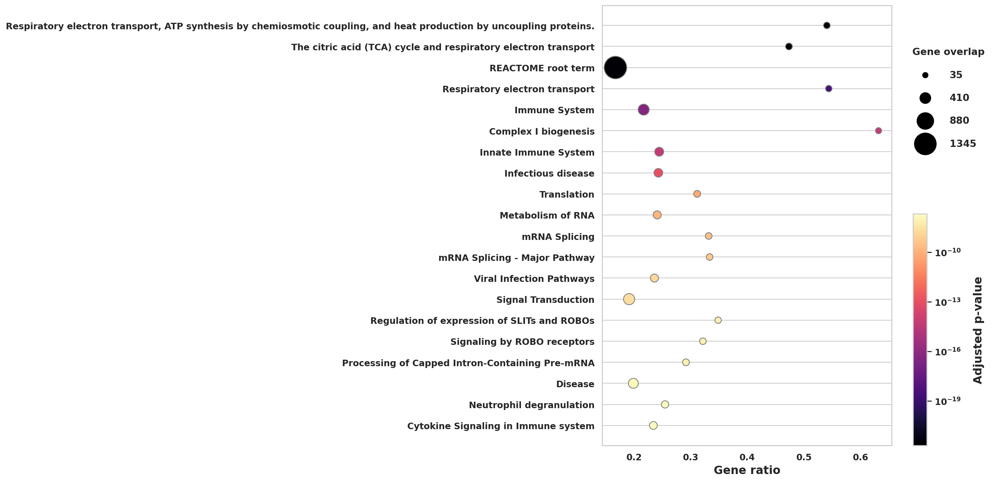

In [137]:
from gprofiler_plotting import plot_enrich
plt.figure(figsize=(8, 10))
plot_enrich(hepatocyte_enrichment, n_terms=20)

### B cell pathways

In [138]:
deg_bcells = adata.uns['edgeR_B_cells']['names']
print(deg_bcells)

[('MALAT1',) ('MT-CO1',) ('IGKC',) ... ('TTC28-AS1',) ('TRIM52-AS1',)
 ('PRKCQ',)]


In [139]:
pvals_adj_numeric = adata.uns['edgeR_B_cells']['pvals_adj']['B_cells']
significant_genes = adata.uns['edgeR_B_cells']['names'][pvals_adj_numeric < 0.05]

In [140]:
significant_genes

rec.array([('IGKC',), ('B2M',), ('MT-CO3',), ..., ('TSPAN5',),
           ('TTC28-AS1',), ('TRIM52-AS1',)],
          dtype=[('B_cells', 'O')])

In [141]:
from gprofiler import GProfiler

# Paso 1: Acceder a los genes diferencialmente expresados y extraer valores numéricos de p-valor ajustado
deg_bcells = adata.uns['edgeR_B_cells']['names']
# Extrae los valores numéricos de p-valor ajustado del campo 'Hepatocytes'
pvals_adj_bcells = adata.uns['edgeR_B_cells']['pvals_adj']['B_cells']

# Verifica que los valores sean numéricos; si no lo son, conviértelos
pvals_adj_bcells = np.array(pvals_adj_bcells, dtype=float)
significant_genes_bcells = adata.uns['edgeR_B_cells']['names'][pvals_adj_numeric < 0.05]
significant_genes_bcells = [gene[0] for gene in adata.uns['edgeR_B_cells']['names'][pvals_adj_bcells < 0.05]]

# Luego, realiza el análisis de enriquecimiento nuevamente
bcells_enrichment = gp.profile(
    organism='hsapiens', 
    sources=['REAC'],  
    user_threshold=0.05,
    significance_threshold_method='fdr',
    background=adata.var_names.tolist(),  
    query=significant_genes_bcells  # Ahora es una lista de cadenas
)

# Verifica los resultados
print(bcells_enrichment)

    source              native  \
0     REAC        REAC:0000000   
1     REAC    REAC:R-HSA-72766   
2     REAC  REAC:R-HSA-5663205   
3     REAC  REAC:R-HSA-2262752   
4     REAC  REAC:R-HSA-8953897   
..     ...                 ...   
438   REAC  REAC:R-HSA-8875360   
439   REAC  REAC:R-HSA-9637687   
440   REAC  REAC:R-HSA-3371511   
441   REAC   REAC:R-HSA-209560   
442   REAC   REAC:R-HSA-196854   

                                                             name  \
0                                              REACTOME root term   
1                                                     Translation   
2                                              Infectious disease   
3                                    Cellular responses to stress   
4                                   Cellular responses to stimuli   
..                                                            ...   
438  InlB-mediated entry of Listeria monocytogenes into host cell   
439                          Suppressio

In [142]:
bcells_enrichment_results = bcells_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]

In [143]:
pd.set_option("display.max_colwidth", 800)
bcells_enrichment_results.iloc[:50,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:0000000,1.148956e-38,8055,2243,0.278461,REACTOME root term
REAC:R-HSA-72766,1.148956e-38,273,169,0.619048,Translation
REAC:R-HSA-5663205,3.569823e-33,836,357,0.427033,Infectious disease
REAC:R-HSA-2262752,3.702798e-32,700,310,0.442857,Cellular responses to stress
REAC:R-HSA-8953897,3.702798e-32,709,313,0.441467,Cellular responses to stimuli
REAC:R-HSA-168256,1.277186e-31,1692,609,0.359929,Immune System
REAC:R-HSA-9824446,1.646461e-29,674,295,0.437685,Viral Infection Pathways
REAC:R-HSA-392499,1.955412e-29,1590,572,0.359748,Metabolism of proteins
REAC:R-HSA-168249,1.884805e-27,884,356,0.402715,Innate Immune System


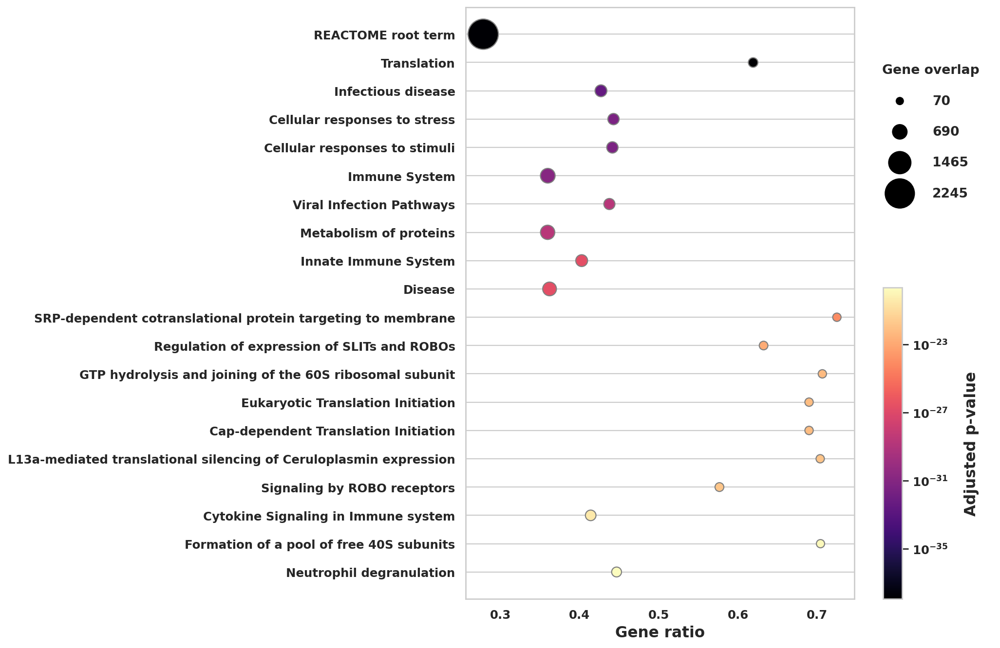

In [144]:
plt.figure(figsize=(8, 10))
plot_enrich(bcells_enrichment, n_terms=20)

### Cholangiocyte pathways

In [145]:
deg_chol = adata.uns['edgeR_Cholangiocytes']['names']
# Extrae los valores numéricos de p-valor ajustado del campo 'Cholangiocytes'
pvals_adj_chol = adata.uns['edgeR_Cholangiocytes']['pvals_adj']['Cholangiocytes']

# Verifica que los valores sean numéricos; si no lo son, conviértelos
pvals_adj_chol = np.array(pvals_adj_chol, dtype=float)
significant_genes_chol = adata.uns['edgeR_Cholangiocytes']['names'][pvals_adj_numeric < 0.05]
significant_genes_chol = [gene[0] for gene in adata.uns['edgeR_Cholangiocytes']['names'][pvals_adj_chol < 0.05]]

# Luego, realiza el análisis de enriquecimiento nuevamente
chol_enrichment = gp.profile(
    organism='hsapiens', 
    sources=['REAC'],  
    user_threshold=0.05,
    significance_threshold_method='fdr',
    background=adata.var_names.tolist(),  
    query=significant_genes_chol  # Ahora es una lista de cadenas
)

# Verifica los resultados
print(chol_enrichment)

    source              native  \
0     REAC        REAC:0000000   
1     REAC  REAC:R-HSA-5663205   
2     REAC    REAC:R-HSA-72766   
3     REAC  REAC:R-HSA-8953854   
4     REAC  REAC:R-HSA-9824446   
..     ...                 ...   
305   REAC   REAC:R-HSA-202733   
306   REAC  REAC:R-HSA-5696399   
307   REAC  REAC:R-HSA-1592230   
308   REAC  REAC:R-HSA-1980143   
309   REAC  REAC:R-HSA-5654738   

                                                  name       p_value  \
0                                   REACTOME root term  2.228055e-27   
1                                   Infectious disease  1.868093e-24   
2                                          Translation  8.186237e-21   
3                                    Metabolism of RNA  3.631360e-20   
4                             Viral Infection Pathways  2.764131e-19   
..                                                 ...           ...   
305     Cell surface interactions at the vascular wall  4.374116e-02   
306  Global Gen

In [146]:
chol_enrichment_results = chol_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]
pd.set_option("display.max_colwidth", 800)
chol_enrichment_results.iloc[:50,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:0000000,2.228055e-27,8055,1485,0.184358,REACTOME root term
REAC:R-HSA-5663205,1.868093e-24,836,249,0.297847,Infectious disease
REAC:R-HSA-72766,8.186237e-21,273,110,0.402930,Translation
REAC:R-HSA-8953854,3.631360e-20,681,204,0.299559,Metabolism of RNA
REAC:R-HSA-9824446,2.764131e-19,674,200,0.296736,Viral Infection Pathways
REAC:R-HSA-163200,1.630202e-18,124,64,0.516129,"Respiratory electron transport, ATP synthesis by chemiosmotic coupling, and heat production by uncoupling proteins."
REAC:R-HSA-9010553,2.583066e-18,155,73,0.470968,Regulation of expression of SLITs and ROBOs
REAC:R-HSA-8953897,3.637687e-18,709,204,0.287729,Cellular responses to stimuli
REAC:R-HSA-168256,6.351647e-18,1692,396,0.234043,Immune System


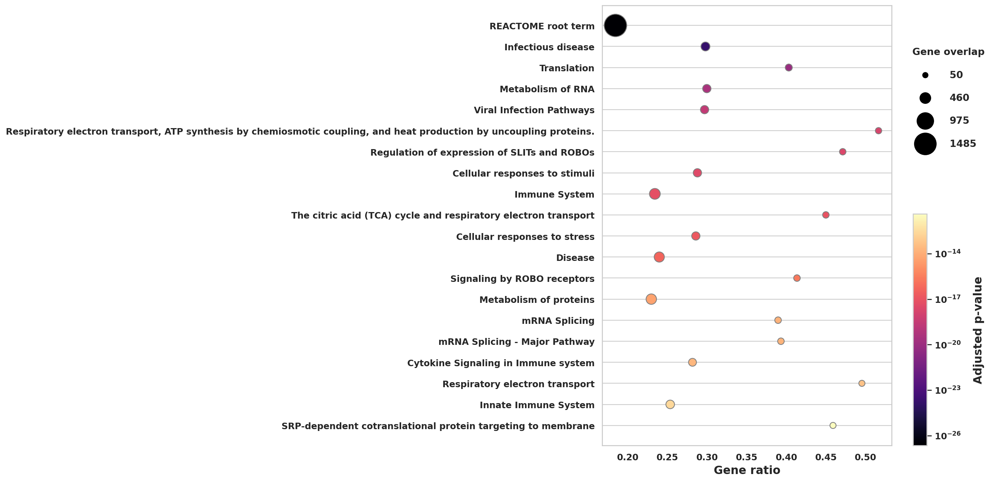

In [147]:
plt.figure(figsize=(8, 10))
plot_enrich(chol_enrichment, n_terms=20)

### T cells

In [148]:
deg_tcells = adata.uns['edgeR_T_cells']['names']
# Extrae los valores numéricos de p-valor ajustado del campo 'Cholangiocytes'
pvals_adj_tcells = adata.uns['edgeR_T_cells']['pvals_adj']['T_cells']

# Verifica que los valores sean numéricos; si no lo son, conviértelos
pvals_adj_tcells = np.array(pvals_adj_tcells, dtype=float)
significant_genes_tcells = adata.uns['edgeR_T_cells']['names'][pvals_adj_numeric < 0.05]
significant_genes_tcells = [gene[0] for gene in adata.uns['edgeR_T_cells']['names'][pvals_adj_tcells < 0.05]]

# Luego, realiza el análisis de enriquecimiento nuevamente
tcells_enrichment = gp.profile(
    organism='hsapiens', 
    sources=['REAC'],  
    user_threshold=0.05,
    significance_threshold_method='fdr',
    background=adata.var_names.tolist(),  
    query=significant_genes_tcells  # Ahora es una lista de cadenas
)

# Verifica los resultados
print(tcells_enrichment)

    source              native  \
0     REAC        REAC:0000000   
1     REAC  REAC:R-HSA-1643685   
2     REAC  REAC:R-HSA-5663205   
3     REAC  REAC:R-HSA-2262752   
4     REAC   REAC:R-HSA-168256   
..     ...                 ...   
396   REAC  REAC:R-HSA-5603041   
397   REAC   REAC:R-HSA-202040   
398   REAC  REAC:R-HSA-9793380   
399   REAC   REAC:R-HSA-450513   
400   REAC   REAC:R-HSA-163210   

                                                         name       p_value  \
0                                          REACTOME root term  5.590329e-20   
1                                                     Disease  7.466247e-19   
2                                          Infectious disease  2.373803e-18   
3                                Cellular responses to stress  2.373803e-18   
4                                               Immune System  2.969216e-18   
..                                                        ...           ...   
396                                 IR

In [149]:
tcells_enrichment_results = tcells_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]
pd.set_option("display.max_colwidth", 800)
tcells_enrichment_results.iloc[:50,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:0000000,5.590329e-20,8055,1477,0.183364,REACTOME root term
REAC:R-HSA-1643685,7.466247e-19,1444,360,0.249307,Disease
REAC:R-HSA-5663205,2.373803e-18,836,235,0.281100,Infectious disease
REAC:R-HSA-2262752,2.373803e-18,700,206,0.294286,Cellular responses to stress
REAC:R-HSA-168256,2.969216e-18,1692,404,0.238771,Immune System
REAC:R-HSA-162582,5.503890e-18,1982,457,0.230575,Signal Transduction
REAC:R-HSA-8953897,7.119859e-18,709,206,0.290550,Cellular responses to stimuli
REAC:R-HSA-72706,3.523118e-14,109,54,0.495413,GTP hydrolysis and joining of the 60S ribosomal subunit
REAC:R-HSA-156827,1.005867e-13,108,53,0.490741,L13a-mediated translational silencing of Ceruloplasmin expression


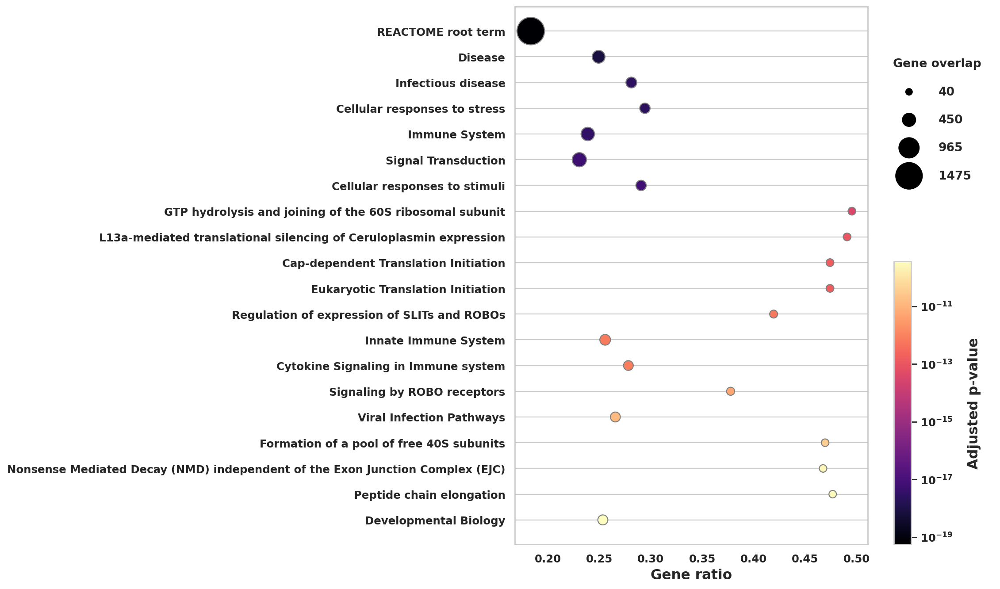

In [150]:
plt.figure(figsize=(8, 10))
plot_enrich(tcells_enrichment_results, n_terms=20)